About the Dataset

Brazilian E-Commerce Public Dataset by Olist

This is a Brazilian ecommerce public dataset of orders made at Olist Store. The dataset has information of 100k orders from 2016 to 2018 made at multiple marketplaces in Brazil. Its features allows viewing an order from multiple dimensions: from order status, price, payment and freight performance to customer location, product attributes and finally reviews written by customers. We also released a geolocation dataset that relates Brazilian zip codes to lat/lng coordinates.

Context

This dataset was generously provided by Olist, the largest department store in Brazilian marketplaces. Olist connects small businesses from all over Brazil to channels without hassle and with a single contract. Those merchants are able to sell their products through the Olist Store and ship them directly to the customers using Olist logistics partners. See more on our website: www.olist.com

After a customer purchases the product from Olist Store a seller gets notified to fulfill that order. Once the customer receives the product, or the estimated delivery date is due, the customer gets a satisfaction survey by email where he can give a note for the purchase experience and write down some comments.

Attention

An order might have multiple items.

Each item might be fulfilled by a distinct seller.

All text identifying stores and partners where replaced by the names of Game of Thrones great houses.

Data Schema

The data is divided in multiple datasets for better understanding and organization.

Our main aim is to do Customer Segmentation by K-Means Clustering with the help of the dataset. We first did some Explotary Data Analysis (EDA) using Data Warehouse oprations like slicing, dicing, roll-up, drill-down and pivot. Then we move to our clustering part like first we did feature engineering by adding various new features like RFM, Product Diversity, Product Based Features, Geographic features, Behavioral features, Seasonality and Trends then we move to correlation analysis for identifying the relationship between the features, then we did feature scaling for normalizing the data. Then next we did dimensionality reduction using PCA to remove the correlated features. Then we finally did clustering using K-Means by identifying our cluster number by elbow method and silhouette method. Then after clustering we did evaluations, analysis and profiling of our clusters.

Why K-means is a popular choice for Customer Segmentation:

Unsupervised Learning: Unlike supervised learning, where models learn from labeled data (e.g., spam vs. non-spam), unsupervised learning identifies patterns in data without labeled examples. In customer segmentation, we often lack labeled data, making unsupervised methods like K-means valuable.

Customer Segmentation: K-means is ideal for creating clearly defined customer segments based on various features. These features might include recency, frequency, monetary value, or product preferences. The model assigns each customer to a cluster, allowing personalized marketing and service strategies.

K-means clustering allows businesses to create meaningful customer segments, tailor marketing efforts, and enhance customer experiences.

How K-means Works: The “k” in K-means represents the number of clusters to create. The algorithm starts by randomly placing “centroids” (initial cluster centers). It then assigns each observation (customer) to the nearest centroid. The centroids are updated by calculating the mean of observations within each cluster. This process continues until further improvement is not possible (minimizing within-cluster sum of square distances).

# Importing Necessary Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress
from sklearn.ensemble import IsolationForest
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
import matplotlib.gridspec as gridspec
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from collections import Counter
import plotly.graph_objects as go
from tabulate import tabulate

%matplotlib inline

# Loading & Merging the Datasets

In [2]:
# Read datasets
olist_customers = pd.read_csv('olist_customers_dataset.csv')
olist_geolocation = pd.read_csv('olist_geolocation_dataset.csv')
olist_order_items = pd.read_csv('olist_order_items_dataset.csv')
olist_order_payments = pd.read_csv('olist_order_payments_dataset.csv')
olist_order_reviews = pd.read_csv('olist_order_reviews_dataset.csv')
olist_orders = pd.read_csv('olist_orders_dataset.csv')
olist_products = pd.read_csv('olist_products_dataset.csv')
olist_sellers = pd.read_csv('olist_sellers_dataset.csv')
product_category_translation = pd.read_csv('product_category_name_translation.csv')

# Merge datasets
merged_data = pd.merge(olist_customers, olist_orders, on='customer_id')
merged_data = pd.merge(merged_data, olist_order_items, on='order_id')
merged_data = pd.merge(merged_data, olist_order_payments, on='order_id')
merged_data = pd.merge(merged_data, olist_order_reviews, on='order_id')
merged_data = pd.merge(merged_data, olist_products, on='product_id')
merged_data = pd.merge(merged_data, olist_sellers, on='seller_id')
merged_data = pd.merge(merged_data, product_category_translation, on='product_category_name')

# Initial Data Analysis

In [3]:
merged_data

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP,office_furniture
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP,office_furniture
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP,office_furniture
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,...,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP,office_furniture
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,...,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP,office_furniture
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115604,0fbd856ba1d4961786fb54bd448eb7fe,96328ac15f58fbb232fe14b182103382,89675,vargem bonita,SC,937592924b66482b823ee7ecd185d0ff,delivered,2018-03-31 19:17:43,2018-03-31 19:55:18,2018-04-02 19:10:46,...,284.0,2.0,12500.0,83.0,21.0,43.0,89701,concordia,SC,la_cuisine
115605,98a1b4f80dd0ccb7d1ae5a75ba5c904e,bf5ed75fca98e8f79c49e9a5bf7690e1,13480,limeira,SP,28915ae2a90c218f0c2b7f8e0fb280e0,delivered,2017-04-09 20:04:37,2017-04-11 03:45:26,2017-04-12 07:03:58,...,194.0,1.0,450.0,31.0,10.0,18.0,89701,concordia,SC,la_cuisine
115606,aa0533eb31ed3be79086f11bb2bec430,a490d5875edefe9bb8f5101ec2f6b56f,13870,sao joao da boa vista,SP,e22a3e8048469ea68906f666d446c25c,delivered,2017-08-28 09:48:01,2017-08-28 10:05:04,2017-08-29 11:05:28,...,731.0,1.0,2200.0,84.0,12.0,15.0,89701,concordia,SC,la_cuisine
115607,d11524bb77c28efad04e4467eac8a660,6968d41eb700f1ea39424e04b854bf7e,30130,belo horizonte,MG,1ce0acf125f1bcd636276dd213363196,delivered,2017-07-31 18:10:29,2017-07-31 18:25:20,2017-08-02 18:22:30,...,429.0,1.0,2700.0,85.0,7.0,40.0,89701,concordia,SC,la_cuisine


In [4]:
# Columns to be dropped
columns_to_drop = [
    'customer_id','customer_zip_code_prefix','order_id','order_item_id','product_id','seller_id','freight_value','review_id','review_comment_title','review_comment_message','review_creation_date','review_answer_timestamp',
    'product_name_lenght','product_description_lenght','seller_zip_code_prefix','product_category_name'
]

# Drop the columns
merged_data = merged_data.drop(columns=columns_to_drop)

In [5]:
print(merged_data.columns)

Index(['customer_unique_id', 'customer_city', 'customer_state', 'order_status',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'shipping_limit_date', 'price',
       'payment_sequential', 'payment_type', 'payment_installments',
       'payment_value', 'review_score', 'product_photos_qty',
       'product_weight_g', 'product_length_cm', 'product_height_cm',
       'product_width_cm', 'seller_city', 'seller_state',
       'product_category_name_english'],
      dtype='object')


In [6]:
merged_data

,customer_unique_id,customer_city,customer_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,shipping_limit_date,...,payment_value,review_score,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_city,seller_state,product_category_name_english
0,861eff4711a542e4b93843c6dd7febb0,franca,SP,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00,2017-05-22 15:22:12,...,146.87,4,1.0,8683.0,54.0,64.0,31.0,itaquaquecetuba,SP,office_furniture
1,9eae34bbd3a474ec5d07949ca7de67c0,santarem,PA,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,2017-11-28 00:09:50,2017-12-19 00:00:00,2017-11-23 00:47:18,...,275.79,1,1.0,8683.0,54.0,64.0,31.0,itaquaquecetuba,SP,office_furniture
2,9eae34bbd3a474ec5d07949ca7de67c0,santarem,PA,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,2017-11-28 00:09:50,2017-12-19 00:00:00,2017-11-23 00:47:18,...,275.79,1,1.0,8683.0,54.0,64.0,31.0,itaquaquecetuba,SP,office_furniture
3,3c799d181c34d51f6d44bbbc563024db,nova santa rita,RS,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,2017-05-26 09:54:04,2017-06-12 00:00:00,2017-05-22 22:22:56,...,140.61,3,1.0,8683.0,54.0,64.0,31.0,itaquaquecetuba,SP,office_furniture
4,23397e992b09769faf5e66f9e171a241,mage,RJ,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,2018-02-28 21:09:00,2018-03-22 00:00:00,2018-02-18 21:29:19,...,137.58,4,1.0,8683.0,54.0,64.0,31.0,itaquaquecetuba,SP,office_furniture
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115604,96328ac15f58fbb232fe14b182103382,vargem bonita,SC,delivered,2018-03-31 19:17:43,2018-03-31 19:55:18,2018-04-02 19:10:46,2018-04-06 22:05:04,2018-04-18 00:00:00,2018-04-05 19:55:18,...,426.70,4,2.0,12500.0,83.0,21.0,43.0,concordia,SC,la_cuisine
115605,bf5ed75fca98e8f79c49e9a5bf7690e1,limeira,SP,delivered,2017-04-09 20:04:37,2017-04-11 03:45:26,2017-04-12 07:03:58,2017-04-18 09:53:40,2017-05-04 00:00:00,2017-04-17 03:45:26,...,63.25,1,1.0,450.0,31.0,10.0,18.0,concordia,SC,la_cuisine
115606,a490d5875edefe9bb8f5101ec2f6b56f,sao joao da boa vista,SP,delivered,2017-08-28 09:48:01,2017-08-28 10:05:04,2017-08-29 11:05:28,2017-09-05 21:42:35,2017-09-19 00:00:00,2017-09-01 10:05:04,...,160.46,5,1.0,2200.0,84.0,12.0,15.0,concordia,SC,la_cuisine
115607,6968d41eb700f1ea39424e04b854bf7e,belo horizonte,MG,delivered,2017-07-31 18:10:29,2017-07-31 18:25:20,2017-08-02 18:22:30,2017-08-09 20:38:07,2017-08-28 00:00:00,2017-08-04 18:25:20,...,55.18,5,1.0,2700.0,85.0,7.0,40.0,concordia,SC,la_cuisine


In [7]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115609 entries, 0 to 115608
Data columns (total 24 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_unique_id             115609 non-null  object 
 1   customer_city                  115609 non-null  object 
 2   customer_state                 115609 non-null  object 
 3   order_status                   115609 non-null  object 
 4   order_purchase_timestamp       115609 non-null  object 
 5   order_approved_at              115595 non-null  object 
 6   order_delivered_carrier_date   114414 non-null  object 
 7   order_delivered_customer_date  113209 non-null  object 
 8   order_estimated_delivery_date  115609 non-null  object 
 9   shipping_limit_date            115609 non-null  object 
 10  price                          115609 non-null  float64
 11  payment_sequential             115609 non-null  int64  
 12  payment_type                  

# Data Cleaning

In [8]:
# Check for missing values
missing_values = merged_data.isnull().sum()

In [9]:
missing_values

customer_unique_id                  0
customer_city                       0
customer_state                      0
order_status                        0
order_purchase_timestamp            0
order_approved_at                  14
order_delivered_carrier_date     1195
order_delivered_customer_date    2400
order_estimated_delivery_date       0
shipping_limit_date                 0
price                               0
payment_sequential                  0
payment_type                        0
payment_installments                0
payment_value                       0
review_score                        0
product_photos_qty                  0
product_weight_g                    1
product_length_cm                   1
product_height_cm                   1
product_width_cm                    1
seller_city                         0
seller_state                        0
product_category_name_english       0
dtype: int64

In [10]:
# Handle missing values
# let's assume we'll drop rows with missing values
merged_data.dropna(inplace=True)

In [11]:
# Check for missing values
missing_values = merged_data.isnull().sum()

In [12]:
missing_values

customer_unique_id               0
customer_city                    0
customer_state                   0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
shipping_limit_date              0
price                            0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
review_score                     0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0
seller_city                      0
seller_state                     0
product_category_name_english    0
dtype: int64

In [13]:
# Finding duplicate rows
duplicate_rows = merged_data[merged_data.duplicated(keep=False)]

In [14]:
# Displaying the number of duplicate rows
print(f"The dataset contains {merged_data.duplicated().sum()} duplicate rows that need to be removed.")

The dataset contains 10763 duplicate rows that need to be removed.


In [15]:
# Removing duplicate rows
merged_data.drop_duplicates(inplace=True)

In [16]:
# Finding duplicate rows
duplicate_rows = merged_data[merged_data.duplicated(keep=False)]

In [17]:
# Displaying the number of duplicate rows
print(f"The dataset contains {merged_data.duplicated().sum()} duplicate rows that need to be removed.")

The dataset contains 0 duplicate rows that need to be removed.


In [18]:
merged_data

,customer_unique_id,customer_city,customer_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,shipping_limit_date,...,payment_value,review_score,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_city,seller_state,product_category_name_english
0,861eff4711a542e4b93843c6dd7febb0,franca,SP,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00,2017-05-22 15:22:12,...,146.87,4,1.0,8683.0,54.0,64.0,31.0,itaquaquecetuba,SP,office_furniture
1,9eae34bbd3a474ec5d07949ca7de67c0,santarem,PA,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,2017-11-28 00:09:50,2017-12-19 00:00:00,2017-11-23 00:47:18,...,275.79,1,1.0,8683.0,54.0,64.0,31.0,itaquaquecetuba,SP,office_furniture
3,3c799d181c34d51f6d44bbbc563024db,nova santa rita,RS,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,2017-05-26 09:54:04,2017-06-12 00:00:00,2017-05-22 22:22:56,...,140.61,3,1.0,8683.0,54.0,64.0,31.0,itaquaquecetuba,SP,office_furniture
4,23397e992b09769faf5e66f9e171a241,mage,RJ,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,2018-02-28 21:09:00,2018-03-22 00:00:00,2018-02-18 21:29:19,...,137.58,4,1.0,8683.0,54.0,64.0,31.0,itaquaquecetuba,SP,office_furniture
5,567ab47ca4deb92d46dbf54dce07d0a7,angelina,SC,delivered,2017-03-23 15:10:17,2017-03-23 15:25:11,2017-03-28 18:23:51,2017-04-11 10:16:56,2017-04-24 00:00:00,2017-04-05 15:25:11,...,142.05,4,1.0,8683.0,54.0,64.0,31.0,itaquaquecetuba,SP,office_furniture
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115604,96328ac15f58fbb232fe14b182103382,vargem bonita,SC,delivered,2018-03-31 19:17:43,2018-03-31 19:55:18,2018-04-02 19:10:46,2018-04-06 22:05:04,2018-04-18 00:00:00,2018-04-05 19:55:18,...,426.70,4,2.0,12500.0,83.0,21.0,43.0,concordia,SC,la_cuisine
115605,bf5ed75fca98e8f79c49e9a5bf7690e1,limeira,SP,delivered,2017-04-09 20:04:37,2017-04-11 03:45:26,2017-04-12 07:03:58,2017-04-18 09:53:40,2017-05-04 00:00:00,2017-04-17 03:45:26,...,63.25,1,1.0,450.0,31.0,10.0,18.0,concordia,SC,la_cuisine
115606,a490d5875edefe9bb8f5101ec2f6b56f,sao joao da boa vista,SP,delivered,2017-08-28 09:48:01,2017-08-28 10:05:04,2017-08-29 11:05:28,2017-09-05 21:42:35,2017-09-19 00:00:00,2017-09-01 10:05:04,...,160.46,5,1.0,2200.0,84.0,12.0,15.0,concordia,SC,la_cuisine
115607,6968d41eb700f1ea39424e04b854bf7e,belo horizonte,MG,delivered,2017-07-31 18:10:29,2017-07-31 18:25:20,2017-08-02 18:22:30,2017-08-09 20:38:07,2017-08-28 00:00:00,2017-08-04 18:25:20,...,55.18,5,1.0,2700.0,85.0,7.0,40.0,concordia,SC,la_cuisine


payment_sequential : a customer may pay an order with more than one payment method

payment_type : a payment method used on some product order

payment_installments : the number of installments a customer paying for an order

payment_value : the value of the payment 

price : the price of the product

rest all columns are easy to understand above those are mentioned are little tricky i.e. mentioned above.

In [20]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 102430 entries, 0 to 115608
Data columns (total 24 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_unique_id             102430 non-null  object 
 1   customer_city                  102430 non-null  object 
 2   customer_state                 102430 non-null  object 
 3   order_status                   102430 non-null  object 
 4   order_purchase_timestamp       102430 non-null  object 
 5   order_approved_at              102430 non-null  object 
 6   order_delivered_carrier_date   102430 non-null  object 
 7   order_delivered_customer_date  102430 non-null  object 
 8   order_estimated_delivery_date  102430 non-null  object 
 9   shipping_limit_date            102430 non-null  object 
 10  price                          102430 non-null  float64
 11  payment_sequential             102430 non-null  int64  
 12  payment_type                  

In [21]:
# Summary statistics for numercal variables
merged_data.describe().T

,count,mean,std,min,25%,50%,75%,max
price,102430.0,123.750588,186.630031,0.85,40.50,78.00,139.0000,6735.00
payment_sequential,102430.0,1.090159,0.669913,1.00,1.00,1.00,1.0000,26.00
payment_installments,102430.0,2.896144,2.725139,0.00,1.00,1.00,4.0000,24.00
payment_value,102430.0,156.468263,215.399544,0.00,57.72,102.03,175.9175,13664.08
review_score,102430.0,4.125491,1.309831,1.00,4.00,5.00,5.0000,5.00
product_photos_qty,102430.0,2.240047,1.742012,1.00,1.00,2.00,3.0000,20.00
product_weight_g,102430.0,2104.744899,3765.523013,0.00,300.00,700.00,1800.0000,40425.00
product_length_cm,102430.0,30.209880,16.102063,7.00,18.00,25.00,38.0000,105.00
product_height_cm,102430.0,16.428019,13.310233,2.00,8.00,13.00,20.0000,105.00
product_width_cm,102430.0,23.135126,11.770592,6.00,15.00,20.00,30.0000,118.00


In [22]:
# Summary statistics for categorical variables
merged_data.describe(include='object').T

,count,unique,top,freq
customer_unique_id,102430,91465,9a736b248f67d166d2fbb006bcb877c3,54
customer_city,102430,4071,sao paulo,16039
customer_state,102430,27,SP,43142
order_status,102430,2,delivered,102423
order_purchase_timestamp,102430,93974,2017-08-08 20:26:31,42
order_approved_at,102430,86571,2017-08-08 20:43:31,42
order_delivered_carrier_date,102430,78413,2018-05-09 15:48:00,47
order_delivered_customer_date,102430,93687,2017-08-14 12:46:18,42
order_estimated_delivery_date,102430,444,2017-12-20 00:00:00,573
shipping_limit_date,102430,89534,2017-08-14 20:43:31,42


In [23]:
# Convert data types
merged_data['order_purchase_timestamp'] = pd.to_datetime(merged_data['order_purchase_timestamp'])
merged_data['order_approved_at'] = pd.to_datetime(merged_data['order_approved_at'])
merged_data['order_delivered_carrier_date'] = pd.to_datetime(merged_data['order_delivered_carrier_date'])
merged_data['order_delivered_customer_date'] = pd.to_datetime(merged_data['order_delivered_customer_date'])
merged_data['order_estimated_delivery_date'] = pd.to_datetime(merged_data['order_estimated_delivery_date'])
merged_data['shipping_limit_date'] = pd.to_datetime(merged_data['shipping_limit_date'])

In [24]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 102430 entries, 0 to 115608
Data columns (total 24 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_unique_id             102430 non-null  object        
 1   customer_city                  102430 non-null  object        
 2   customer_state                 102430 non-null  object        
 3   order_status                   102430 non-null  object        
 4   order_purchase_timestamp       102430 non-null  datetime64[ns]
 5   order_approved_at              102430 non-null  datetime64[ns]
 6   order_delivered_carrier_date   102430 non-null  datetime64[ns]
 7   order_delivered_customer_date  102430 non-null  datetime64[ns]
 8   order_estimated_delivery_date  102430 non-null  datetime64[ns]
 9   shipping_limit_date            102430 non-null  datetime64[ns]
 10  price                          102430 non-null  float64       
 11  

# Exploratory Data Analysis (EDA)

EDA of Data Warehouse operations on `customer_unique_id` = '9a736b248f67d166d2fbb006bcb877c3'

Slicing: Slicing in Online Analytical Processing (OLAP) involves selecting one specific dimension from a cube to create a new sub-cube, offering information from a different perspective. It focuses on a particular dimension and filters the data based on specific criteria, resulting in a subset of the original cube.

Dicing: Dicing, similar to slicing, defines a subcube by selecting two or more dimensions from a cube. It involves creating a new sub-cube by adding values for each selected dimension, allowing for a more detailed analysis of the data based on multiple criteria.

Roll-up: Roll-up, also known as consolidation or aggregation, is an OLAP operation that involves summarizing data by climbing up a concept hierarchy for a dimension or reducing dimensions. It aggregates data at a higher level of abstraction, allowing for a more generalized view of the information.

Drill-down: Drill-down is the reverse operation of roll-up in OLAP. It involves navigating from less detailed data to highly detailed data by stepping down a concept hierarchy for a dimension or introducing a new dimension. Drill-down adds more granularity to the data, providing a more detailed perspective.

Pivot: Pivot, also known as rotation, is an OLAP operation that reorients the data axes to present an alternative view of the data cube. It involves changing the dimensional orientation of the cube, allowing for a different perspective on the data by grouping data with different dimensions.

These operations, including slicing, dicing, roll-up, drill-down, and pivot, are fundamental in OLAP systems, enabling users to analyze data from various angles, levels of detail, and dimensions to extract valuable insights for decision-making and analysis.

In [25]:
# Slicing
slice_data = merged_data[merged_data['customer_unique_id'] == '9a736b248f67d166d2fbb006bcb877c3']

In [26]:
slice_data

,customer_unique_id,customer_city,customer_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,shipping_limit_date,...,payment_value,review_score,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_city,seller_state,product_category_name_english
6774,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-07-27 12:50:46,2017-07-27 13:15:19,2017-07-31 20:29:16,2017-08-01 13:42:28,2017-08-16,2017-08-02 13:15:19,...,1.27,5,1.0,15100.0,50.0,40.0,40.0,pedreira,SP,furniture_decor
6775,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-07-27 12:50:46,2017-07-27 13:15:19,2017-07-31 20:29:16,2017-08-01 13:42:28,2017-08-16,2017-08-02 13:15:19,...,8.00,5,1.0,15100.0,50.0,40.0,40.0,pedreira,SP,furniture_decor
6776,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-07-27 12:50:46,2017-07-27 13:15:19,2017-07-31 20:29:16,2017-08-01 13:42:28,2017-08-16,2017-08-02 13:15:19,...,8.00,5,1.0,15100.0,50.0,40.0,40.0,pedreira,SP,furniture_decor
6777,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-07-27 12:50:46,2017-07-27 13:15:19,2017-07-31 20:29:16,2017-08-01 13:42:28,2017-08-16,2017-08-02 13:15:19,...,8.03,5,1.0,15100.0,50.0,40.0,40.0,pedreira,SP,furniture_decor
6778,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-07-27 12:50:46,2017-07-27 13:15:19,2017-07-31 20:29:16,2017-08-01 13:42:28,2017-08-16,2017-08-02 13:15:19,...,0.74,5,1.0,15100.0,50.0,40.0,40.0,pedreira,SP,furniture_decor
6779,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-07-27 12:50:46,2017-07-27 13:15:19,2017-07-31 20:29:16,2017-08-01 13:42:28,2017-08-16,2017-08-02 13:15:19,...,8.00,5,1.0,15100.0,50.0,40.0,40.0,pedreira,SP,furniture_decor
6780,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-07-27 12:50:46,2017-07-27 13:15:19,2017-07-31 20:29:16,2017-08-01 13:42:28,2017-08-16,2017-08-02 13:15:19,...,4.00,5,1.0,15100.0,50.0,40.0,40.0,pedreira,SP,furniture_decor
6781,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-07-27 12:50:46,2017-07-27 13:15:19,2017-07-31 20:29:16,2017-08-01 13:42:28,2017-08-16,2017-08-02 13:15:19,...,8.00,5,1.0,15100.0,50.0,40.0,40.0,pedreira,SP,furniture_decor
6782,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-07-27 12:50:46,2017-07-27 13:15:19,2017-07-31 20:29:16,2017-08-01 13:42:28,2017-08-16,2017-08-02 13:15:19,...,8.00,5,1.0,15100.0,50.0,40.0,40.0,pedreira,SP,furniture_decor
6783,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-07-27 12:50:46,2017-07-27 13:15:19,2017-07-31 20:29:16,2017-08-01 13:42:28,2017-08-16,2017-08-02 13:15:19,...,8.00,5,1.0,15100.0,50.0,40.0,40.0,pedreira,SP,furniture_decor


In [27]:
slice_data.describe().T

,count,mean,std,min,25%,50%,75%,max
price,54.0,47.685000,31.545972,12.99,12.99,45.200,83.80,83.8
payment_sequential,54.0,10.000000,5.943127,1.00,5.00,9.500,14.75,21.0
payment_installments,54.0,1.000000,0.000000,1.00,1.00,1.000,1.00,1.0
payment_value,54.0,7.311296,6.539112,0.24,2.61,3.305,16.70,16.7
review_score,54.0,5.000000,0.000000,5.00,5.00,5.000,5.00,5.0
product_photos_qty,54.0,4.111111,3.154312,1.00,2.00,2.000,8.00,8.0
product_weight_g,54.0,4036.111111,5981.405280,450.00,450.00,1300.000,1300.00,15100.0
product_length_cm,54.0,42.222222,9.841511,30.00,30.00,50.000,50.00,50.0
product_height_cm,54.0,20.166667,11.767801,9.00,9.00,20.000,20.00,40.0
product_width_cm,54.0,29.111111,14.588270,11.00,11.00,40.000,41.00,41.0


In [28]:
slice_data.describe(include='object').T

,count,unique,top,freq
customer_unique_id,54,1,9a736b248f67d166d2fbb006bcb877c3,54
customer_city,54,1,sao paulo,54
customer_state,54,1,SP,54
order_status,54,1,delivered,54
payment_type,54,1,voucher,54
seller_city,54,3,joinville,21
seller_state,54,3,SC,21
product_category_name_english,54,3,housewares,21


In [29]:
# Dicing
dice_data = merged_data[(merged_data['customer_unique_id'] == '9a736b248f67d166d2fbb006bcb877c3')
                        & (merged_data['price'] >= 47.685)
                        & (merged_data['payment_sequential'] >= 10)
                        & (merged_data['payment_value'] >= 7.311296)
                        & (merged_data['seller_city'] == 'joinville')
                        & (merged_data['seller_state'] == 'SC') 
                        & (merged_data['product_category_name_english'] == 'housewares')] 

In [30]:
dice_data

,customer_unique_id,customer_city,customer_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,shipping_limit_date,...,payment_value,review_score,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_city,seller_state,product_category_name_english
33175,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30,2017-08-14 20:43:31,...,16.7,5,8.0,450.0,30.0,20.0,11.0,joinville,SC,housewares
33177,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30,2017-08-14 20:43:31,...,16.7,5,8.0,450.0,30.0,20.0,11.0,joinville,SC,housewares
33178,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30,2017-08-14 20:43:31,...,16.7,5,8.0,450.0,30.0,20.0,11.0,joinville,SC,housewares
33183,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30,2017-08-14 20:43:31,...,16.7,5,8.0,450.0,30.0,20.0,11.0,joinville,SC,housewares
33186,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30,2017-08-14 20:43:31,...,16.7,5,8.0,450.0,30.0,20.0,11.0,joinville,SC,housewares
33189,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30,2017-08-14 20:43:31,...,16.7,5,8.0,450.0,30.0,20.0,11.0,joinville,SC,housewares
33191,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30,2017-08-14 20:43:31,...,16.7,5,8.0,450.0,30.0,20.0,11.0,joinville,SC,housewares
33193,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30,2017-08-14 20:43:31,...,16.7,5,8.0,450.0,30.0,20.0,11.0,joinville,SC,housewares


In [31]:
# Rollup
rollup_data = merged_data[merged_data['customer_unique_id'] == '9a736b248f67d166d2fbb006bcb877c3'][['price', 'payment_value']].sum()

In [32]:
rollup_data

price            2574.99
payment_value     394.81
dtype: float64

In [33]:
# Drill Down
drilldown_data = merged_data[merged_data['customer_unique_id'] == '9a736b248f67d166d2fbb006bcb877c3'].groupby('product_category_name_english')[['price', 'payment_value']].sum()

In [34]:
drilldown_data

,price,payment_value
product_category_name_english,,
bed_bath_table,272.79,161.32
furniture_decor,542.40,72.17
housewares,1759.80,161.32


In [35]:
# Pivot
customer_id = '9a736b248f67d166d2fbb006bcb877c3'
customer_data = merged_data[merged_data['customer_unique_id'] == customer_id]

pivot_merged_data = customer_data.pivot_table(index='customer_unique_id', columns='product_category_name_english', values=['price','payment_value'], aggfunc='sum')

In [36]:
pivot_merged_data

payment_value                             \
product_category_name_english    bed_bath_table furniture_decor housewares   
customer_unique_id                                                           
9a736b248f67d166d2fbb006bcb877c3         161.32           72.17     161.32   

                                          price                             
product_category_name_english    bed_bath_table furniture_decor housewares  
customer_unique_id                                                          
9a736b248f67d166d2fbb006bcb877c3         272.79           542.4     1759.8

# Feature Engineering

Feature Engineering helps to make a Customer centric dataset for K-Means Clustering.

RFM Features:

RFM is a method used for analyzing customer value and segmenting the customer base.

Recency (R)

Recency (R): This metric denotes the duration since the customer's last purchase. A lower figure suggests recent purchases, indicating higher engagement with the business. Conversely, a higher value may imply decreased engagement or a lapse. By gauging purchase recency, businesses can customize marketing approaches to re-engage customers who haven't made recent purchases, potentially enhancing retention and fostering loyalty.

In [37]:
# Convert order_delivered_customer_date to datetime and extract only the date
merged_data['order_delivered_customer_date_new'] = merged_data['order_delivered_customer_date'].dt.date

# Find the most recent purchase date for each customer
customer_engagement = merged_data.groupby('customer_unique_id')['order_delivered_customer_date_new'].max().reset_index()

# Find the most recent date in the entire dataset
most_recent_date = merged_data['order_delivered_customer_date_new'].max()

# Convert order_delivered_customer_date_new to datetime type before subtraction
customer_engagement['order_delivered_customer_date_new'] = pd.to_datetime(customer_engagement['order_delivered_customer_date_new'])
most_recent_date = pd.to_datetime(most_recent_date)

# Calculate the number of days since the last purchase for each customer
customer_engagement['Days Since Last Purchase'] = (most_recent_date - customer_engagement['order_delivered_customer_date_new']).dt.days

# Remove the order_delivered_customer_date_new column
customer_engagement.drop(columns=['order_delivered_customer_date_new'], inplace=True)

In [38]:
merged_data.drop('order_delivered_customer_date_new', axis=1, inplace=True)

In [39]:
customer_engagement

,customer_unique_id,Days Since Last Purchase
0,0000366f3b9a7992bf8c76cfdf3221e2,154
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160
2,0000f46a3911fa3c0805444483337064,560
3,0000f6ccb0745a6a4b88665a16c9f078,350
4,0004aac84e0df4da2b147fca70cf8255,324
...,...,...
91460,fffcf5a5ff07b0908bd4e2dbc735a684,468
91461,fffea47cd6d3cc0a88bd621562a9d061,281
91462,ffff371b4d645b6ecea244b27531430a,602
91463,ffff5962728ec6157033ef9805bacc48,156


Frequency (F)

It helps in evaluating the level of engagement of the customer.

Total Orders: This metric reflects the overall number of orders completed by each customer.

A higher frequency value indicates a customer's higher loyalty or satisfaction and also vice-versa.

In [40]:
# Count the total number of orders for each customer
total_orders = merged_data.groupby('customer_unique_id')['order_delivered_customer_date'].nunique().reset_index(name='total_orders')

In [41]:
customer_engagement = pd.merge(customer_engagement, total_orders, on='customer_unique_id')

In [42]:
customer_engagement

,customer_unique_id,Days Since Last Purchase,total_orders
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1
2,0000f46a3911fa3c0805444483337064,560,1
3,0000f6ccb0745a6a4b88665a16c9f078,350,1
4,0004aac84e0df4da2b147fca70cf8255,324,1
...,...,...,...
91460,fffcf5a5ff07b0908bd4e2dbc735a684,468,1
91461,fffea47cd6d3cc0a88bd621562a9d061,281,1
91462,ffff371b4d645b6ecea244b27531430a,602,1
91463,ffff5962728ec6157033ef9805bacc48,156,1


Monetary (M)

Total Spend: This metric reflects the total amount of money spent by each customer.

Average Order Value: Total Spend / Total Orders

Customers who have a higher monetary value have contributed more to the business, indicating their potential high lifetime value and also vice-versa.

In [43]:
# Calculate the total spend for each customer
total_spend = merged_data.groupby('customer_unique_id')['payment_value'].sum().reset_index(name='total_spend')

In [44]:
customer_engagement = pd.merge(customer_engagement, total_spend, on='customer_unique_id')

In [45]:
customer_engagement

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1,27.19
2,0000f46a3911fa3c0805444483337064,560,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,350,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,324,1,196.89
...,...,...,...,...
91460,fffcf5a5ff07b0908bd4e2dbc735a684,468,1,4134.84
91461,fffea47cd6d3cc0a88bd621562a9d061,281,1,84.58
91462,ffff371b4d645b6ecea244b27531430a,602,1,112.46
91463,ffff5962728ec6157033ef9805bacc48,156,1,133.69


In [46]:
# Calculate the average order value
customer_engagement['average_order_value'] = customer_engagement['total_spend'] / customer_engagement['total_orders']

In [47]:
customer_engagement

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend,average_order_value
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1,141.90,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1,27.19,27.19
2,0000f46a3911fa3c0805444483337064,560,1,86.22,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,350,1,43.62,43.62
4,0004aac84e0df4da2b147fca70cf8255,324,1,196.89,196.89
...,...,...,...,...,...
91460,fffcf5a5ff07b0908bd4e2dbc735a684,468,1,4134.84,4134.84
91461,fffea47cd6d3cc0a88bd621562a9d061,281,1,84.58,84.58
91462,ffff371b4d645b6ecea244b27531430a,602,1,112.46,112.46
91463,ffff5962728ec6157033ef9805bacc48,156,1,133.69,133.69


Product Diversity:

Product purchase behavior of customers.

Unique Products Purchased: This metric reflects the unique products purchased by each customer.

A higher figure suggests diverse tastes or preferences, encompassing a broad array of products and vice-versa.

In [48]:
# Count the number of unique products purchased
unique_products_purchased = merged_data.groupby('customer_unique_id')['product_category_name_english'].nunique().reset_index(name='unique_products_purchased')

In [49]:
customer_engagement = pd.merge(customer_engagement, unique_products_purchased, on='customer_unique_id')

In [50]:
customer_engagement

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend,average_order_value,unique_products_purchased
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1,141.90,141.90,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1,27.19,27.19,1
2,0000f46a3911fa3c0805444483337064,560,1,86.22,86.22,1
3,0000f6ccb0745a6a4b88665a16c9f078,350,1,43.62,43.62,1
4,0004aac84e0df4da2b147fca70cf8255,324,1,196.89,196.89,1
...,...,...,...,...,...,...
91460,fffcf5a5ff07b0908bd4e2dbc735a684,468,1,4134.84,4134.84,1
91461,fffea47cd6d3cc0a88bd621562a9d061,281,1,84.58,84.58,1
91462,ffff371b4d645b6ecea244b27531430a,602,1,112.46,112.46,1
91463,ffff5962728ec6157033ef9805bacc48,156,1,133.69,133.69,1


Product based features & Geographic Features:

Product-based Features: This involves segmenting customers based on the products they are interested in or have purchased. This helps in understanding which products are popular among different customer segments and how to position them in the marketing efforts.

Geographic Features: This reflects the geographical location of customers. Different regions might have varying preferences and purchasing behaviors which can be critical in personalizing marketing strategies and inventory planning.

In [51]:
merged_data['product_category_name_english'].value_counts(normalize=True)

bed_bath_table               0.102860
health_beauty                0.088207
sports_leisure               0.077155
computers_accessories        0.067695
furniture_decor              0.067441
                               ...   
arts_and_craftmanship        0.000234
la_cuisine                   0.000137
cds_dvds_musicals            0.000117
fashion_childrens_clothes    0.000068
security_and_services        0.000020
Name: product_category_name_english, Length: 71, dtype: float64

In [52]:
merged_data['customer_state'].value_counts(normalize=True)

SP    0.421185
RJ    0.128615
MG    0.117104
RS    0.055355
PR    0.050708
SC    0.036025
BA    0.034433
DF    0.021341
ES    0.020512
GO    0.020326
PE    0.016353
CE    0.013307
PA    0.009538
MT    0.009138
MA    0.007293
MS    0.007205
PB    0.005350
RN    0.005077
PI    0.004881
AL    0.004032
SE    0.003397
TO    0.002968
RO    0.002490
AM    0.001494
AC    0.000801
AP    0.000693
RR    0.000381
Name: customer_state, dtype: float64

In [53]:
# Product-based Features
# Set product category name based on majority
majority_product = merged_data['product_category_name_english'].mode()[0]
# Count customers buying the same product category
customer_engagement['Buying_Same_Product'] = merged_data['product_category_name_english'].apply(lambda x: 1 if x == majority_product else 0)

# Geographic Features
# Set location based on majority
majority_location = merged_data['customer_state'].mode()[0]
# Count customers from the same location
customer_engagement['From_Same_Location'] = merged_data['customer_state'].apply(lambda x: 1 if x == majority_location else 0)

In [54]:
majority_product

'bed_bath_table'

In [55]:
majority_location

'SP'

In [56]:
customer_engagement

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend,average_order_value,unique_products_purchased,Buying_Same_Product,From_Same_Location
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1,141.90,141.90,1,0.0,1.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1,27.19,27.19,1,0.0,0.0
2,0000f46a3911fa3c0805444483337064,560,1,86.22,86.22,1,NaN,NaN
3,0000f6ccb0745a6a4b88665a16c9f078,350,1,43.62,43.62,1,0.0,0.0
4,0004aac84e0df4da2b147fca70cf8255,324,1,196.89,196.89,1,0.0,0.0
...,...,...,...,...,...,...,...,...
91460,fffcf5a5ff07b0908bd4e2dbc735a684,468,1,4134.84,4134.84,1,0.0,1.0
91461,fffea47cd6d3cc0a88bd621562a9d061,281,1,84.58,84.58,1,NaN,NaN
91462,ffff371b4d645b6ecea244b27531430a,602,1,112.46,112.46,1,0.0,0.0
91463,ffff5962728ec6157033ef9805bacc48,156,1,133.69,133.69,1,0.0,0.0


Behavioral Features:

Our objective is to grasp and record customers' shopping patterns and behaviors, providing insights into their preferences regarding the timing of their shopping activities.

Days Between Purchases: This metric indicates the average duration in days that a customer waits before making another purchase. This understanding can aid in predicting when customers are likely to make their next purchase, which is vital for targeted marketing strategies and personalized promotions.

In [57]:
# Group orders by customer_unique_id and calculate the time difference between consecutive purchases
merged_data['average_days_between_purchases'] = merged_data.groupby('customer_unique_id')['order_delivered_customer_date'].diff().dt.days

# Calculate average days between purchases for each customer
average_days_between_purchases = merged_data.groupby('customer_unique_id')['average_days_between_purchases'].mean().reset_index()

# Fill NaN values with 0
average_days_between_purchases['average_days_between_purchases'] = average_days_between_purchases['average_days_between_purchases'].fillna(0)

In [58]:
customer_engagement = pd.merge(customer_engagement, average_days_between_purchases, on='customer_unique_id')

In [59]:
merged_data.drop('average_days_between_purchases', axis=1, inplace=True)

In [60]:
customer_engagement

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend,average_order_value,unique_products_purchased,Buying_Same_Product,From_Same_Location,average_days_between_purchases
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1,141.90,141.90,1,0.0,1.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1,27.19,27.19,1,0.0,0.0,0.0
2,0000f46a3911fa3c0805444483337064,560,1,86.22,86.22,1,NaN,NaN,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,350,1,43.62,43.62,1,0.0,0.0,0.0
4,0004aac84e0df4da2b147fca70cf8255,324,1,196.89,196.89,1,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
91460,fffcf5a5ff07b0908bd4e2dbc735a684,468,1,4134.84,4134.84,1,0.0,1.0,0.0
91461,fffea47cd6d3cc0a88bd621562a9d061,281,1,84.58,84.58,1,NaN,NaN,0.0
91462,ffff371b4d645b6ecea244b27531430a,602,1,112.46,112.46,1,0.0,0.0,0.0
91463,ffff5962728ec6157033ef9805bacc48,156,1,133.69,133.69,1,0.0,0.0,0.0


Seasonality & Trends:

Monthly and Yearly Spending Averages: These metrics represent the mean amount a customer spends per month and year, respectively. They offer a glimpse into each customer's general spending habits. A higher mean suggests a propensity for higher spending, while a lower mean may reflect more budget-conscious behavior.

Monthly and Yearly Spending Variability: These features indicate the fluctuation in a customer's monthly and yearly spending. A higher value indicates significant month-to-month or year-to-year spending variability, potentially reflecting sporadic large purchases. Conversely, a lower value suggests more stable, consistent spending patterns. Understanding this variability can inform the timing of personalized promotions or discounts.

Spending Trend: This metric illustrates the trajectory of a customer's spending over time. A positive value signifies increasing spending, possibly indicating growing loyalty or satisfaction. Conversely, a negative trend may signal declining interest or satisfaction, prompting the need for re-engagement strategies. A near-zero value indicates stable spending habits. Recognizing these trends enables the development of strategies to maintain or alter customer spending patterns, thereby optimizing marketing campaigns.

In [61]:
# Extract month and year from order_delivered_customer_date
merged_data['Month'] = merged_data['order_delivered_customer_date'].dt.month
merged_data['Year'] = merged_data['order_delivered_customer_date'].dt.year

# Calculate monthly spending mean and standard deviation for each customer
monthly_spending_stats = merged_data.groupby(['customer_unique_id', 'Month'])['payment_value'].sum().groupby('customer_unique_id').agg(['mean', 'std']).reset_index()
monthly_spending_stats.columns = ['customer_unique_id', 'Monthly_Spending_Mean', 'Monthly_Spending_Std']

# Calculate yearly spending mean and standard deviation for each customer
yearly_spending_stats = merged_data.groupby(['customer_unique_id', 'Year'])['payment_value'].sum().groupby('customer_unique_id').agg(['mean', 'std']).reset_index()
yearly_spending_stats.columns = ['customer_unique_id', 'Yearly_Spending_Mean', 'Yearly_Spending_Std']

# Merge the results with customer_engagement dataframe
customer_engagement = pd.merge(customer_engagement, monthly_spending_stats, on='customer_unique_id', how='left')
customer_engagement = pd.merge(customer_engagement, yearly_spending_stats, on='customer_unique_id', how='left')

# Calculate spending trend for each customer
def calculate_spending_trend(x):
    slope, _, _, _, _ = linregress(np.arange(len(x)), x)
    return slope

spending_trend = merged_data.groupby('customer_unique_id')['payment_value'].apply(calculate_spending_trend).reset_index()
# Name the column
spending_trend.columns = ['customer_unique_id', 'Spending_Trend']

In [62]:
# Fill NaN values with 0
customer_engagement['Monthly_Spending_Std'] = customer_engagement['Monthly_Spending_Std'].fillna(0)
customer_engagement['Yearly_Spending_Std'] = customer_engagement['Yearly_Spending_Std'].fillna(0)
spending_trend['Spending_Trend'] = spending_trend['Spending_Trend'].fillna(0)

In [63]:
customer_engagement = pd.merge(customer_engagement, spending_trend, on='customer_unique_id')

In [64]:
merged_data.drop('Month', axis=1, inplace=True)
merged_data.drop('Year', axis=1, inplace=True)

In [65]:
customer_engagement

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend,average_order_value,unique_products_purchased,Buying_Same_Product,From_Same_Location,average_days_between_purchases,Monthly_Spending_Mean,Monthly_Spending_Std,Yearly_Spending_Mean,Yearly_Spending_Std,Spending_Trend
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1,141.90,141.90,1,0.0,1.0,0.0,141.90,0.0,141.90,0.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1,27.19,27.19,1,0.0,0.0,0.0,27.19,0.0,27.19,0.0,0.0
2,0000f46a3911fa3c0805444483337064,560,1,86.22,86.22,1,NaN,NaN,0.0,86.22,0.0,86.22,0.0,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,350,1,43.62,43.62,1,0.0,0.0,0.0,43.62,0.0,43.62,0.0,0.0
4,0004aac84e0df4da2b147fca70cf8255,324,1,196.89,196.89,1,0.0,0.0,0.0,196.89,0.0,196.89,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91460,fffcf5a5ff07b0908bd4e2dbc735a684,468,1,4134.84,4134.84,1,0.0,1.0,0.0,4134.84,0.0,4134.84,0.0,0.0
91461,fffea47cd6d3cc0a88bd621562a9d061,281,1,84.58,84.58,1,NaN,NaN,0.0,84.58,0.0,84.58,0.0,0.0
91462,ffff371b4d645b6ecea244b27531430a,602,1,112.46,112.46,1,0.0,0.0,0.0,112.46,0.0,112.46,0.0,0.0
91463,ffff5962728ec6157033ef9805bacc48,156,1,133.69,133.69,1,0.0,0.0,0.0,133.69,0.0,133.69,0.0,0.0


In [66]:
customer_engagement.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91465 entries, 0 to 91464
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   customer_unique_id              91465 non-null  object 
 1   Days Since Last Purchase        91465 non-null  int64  
 2   total_orders                    91465 non-null  int64  
 3   total_spend                     91465 non-null  float64
 4   average_order_value             91465 non-null  float64
 5   unique_products_purchased       91465 non-null  int64  
 6   Buying_Same_Product             80577 non-null  float64
 7   From_Same_Location              80577 non-null  float64
 8   average_days_between_purchases  91465 non-null  float64
 9   Monthly_Spending_Mean           91465 non-null  float64
 10  Monthly_Spending_Std            91465 non-null  float64
 11  Yearly_Spending_Mean            91465 non-null  float64
 12  Yearly_Spending_Std             

# Data Cleaning of Feature Engineering Dataframe

In [67]:
missing_values = customer_engagement.isnull().sum()

In [68]:
missing_values

customer_unique_id                    0
Days Since Last Purchase              0
total_orders                          0
total_spend                           0
average_order_value                   0
unique_products_purchased             0
Buying_Same_Product               10888
From_Same_Location                10888
average_days_between_purchases        0
Monthly_Spending_Mean                 0
Monthly_Spending_Std                  0
Yearly_Spending_Mean                  0
Yearly_Spending_Std                   0
Spending_Trend                        0
dtype: int64

In [69]:
customer_engagement.dropna(inplace=True)

In [70]:
missing_values = customer_engagement.isnull().sum()

In [71]:
missing_values

customer_unique_id                0
Days Since Last Purchase          0
total_orders                      0
total_spend                       0
average_order_value               0
unique_products_purchased         0
Buying_Same_Product               0
From_Same_Location                0
average_days_between_purchases    0
Monthly_Spending_Mean             0
Monthly_Spending_Std              0
Yearly_Spending_Mean              0
Yearly_Spending_Std               0
Spending_Trend                    0
dtype: int64

In [72]:
duplicate_rows = customer_engagement[customer_engagement.duplicated(keep=False)]

In [73]:
print(f"The dataset contains {customer_engagement.duplicated().sum()} duplicate rows that need to be removed.")

The dataset contains 0 duplicate rows that need to be removed.


In [74]:
customer_engagement

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend,average_order_value,unique_products_purchased,Buying_Same_Product,From_Same_Location,average_days_between_purchases,Monthly_Spending_Mean,Monthly_Spending_Std,Yearly_Spending_Mean,Yearly_Spending_Std,Spending_Trend
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1,141.90,141.90,1,0.0,1.0,0.0,141.90,0.0,141.90,0.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1,27.19,27.19,1,0.0,0.0,0.0,27.19,0.0,27.19,0.0,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,350,1,43.62,43.62,1,0.0,0.0,0.0,43.62,0.0,43.62,0.0,0.0
4,0004aac84e0df4da2b147fca70cf8255,324,1,196.89,196.89,1,0.0,0.0,0.0,196.89,0.0,196.89,0.0,0.0
5,0004bd2a26a76fe21f786e4fbd80607f,193,1,166.98,166.98,1,0.0,0.0,0.0,166.98,0.0,166.98,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91459,fffb09418989a0dbff854a28163e47c6,295,1,73.16,73.16,1,0.0,1.0,0.0,73.16,0.0,73.16,0.0,0.0
91460,fffcf5a5ff07b0908bd4e2dbc735a684,468,1,4134.84,4134.84,1,0.0,1.0,0.0,4134.84,0.0,4134.84,0.0,0.0
91462,ffff371b4d645b6ecea244b27531430a,602,1,112.46,112.46,1,0.0,0.0,0.0,112.46,0.0,112.46,0.0,0.0
91463,ffff5962728ec6157033ef9805bacc48,156,1,133.69,133.69,1,0.0,0.0,0.0,133.69,0.0,133.69,0.0,0.0


In [75]:
customer_engagement.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80577 entries, 0 to 91464
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   customer_unique_id              80577 non-null  object 
 1   Days Since Last Purchase        80577 non-null  int64  
 2   total_orders                    80577 non-null  int64  
 3   total_spend                     80577 non-null  float64
 4   average_order_value             80577 non-null  float64
 5   unique_products_purchased       80577 non-null  int64  
 6   Buying_Same_Product             80577 non-null  float64
 7   From_Same_Location              80577 non-null  float64
 8   average_days_between_purchases  80577 non-null  float64
 9   Monthly_Spending_Mean           80577 non-null  float64
 10  Monthly_Spending_Std            80577 non-null  float64
 11  Yearly_Spending_Mean            80577 non-null  float64
 12  Yearly_Spending_Std             

In [76]:
customer_engagement.describe().T

,count,mean,std,min,25%,50%,75%,max
Days Since Last Purchase,80577.0,272.807091,151.654113,0.00,152.00,253.00,381.00,736.000000
total_orders,80577.0,1.032466,0.202835,1.00,1.00,1.00,1.00,14.000000
total_spend,80577.0,175.154518,255.765332,9.59,63.22,108.77,188.34,9587.190000
average_order_value,80577.0,169.732362,246.345926,9.59,62.65,106.78,182.69,9587.190000
unique_products_purchased,80577.0,1.024908,0.166398,1.00,1.00,1.00,1.00,5.000000
Buying_Same_Product,80577.0,0.130757,0.337136,0.00,0.00,0.00,0.00,1.000000
From_Same_Location,80577.0,0.423173,0.494065,0.00,0.00,0.00,1.00,1.000000
average_days_between_purchases,80577.0,0.060027,21.282790,-577.00,0.00,0.00,0.00,604.000000
Monthly_Spending_Mean,80577.0,171.737614,251.008913,9.59,62.91,107.58,184.92,9587.190000
Monthly_Spending_Std,80577.0,1.732033,24.938059,0.00,0.00,0.00,0.00,1688.698273


In [77]:
customer_engagement.describe(include='object').T

,count,unique,top,freq
customer_unique_id,80577,80577,0000366f3b9a7992bf8c76cfdf3221e2,1


Now the Feature Engineering process is completed. Variety of new features focussing on the customers have been created which will give a deeper understanding of their buying patterns and preferences.

Now the next step is checking and handling outliers and preparing our data for clustering.

# Outlier Detection and Treatment

Outliers are data points that deviate significantly from the majority of other observations in the dataset. They have the potential to distort the outcomes of our analysis, particularly in techniques like k-means clustering, where they can heavily influence the positioning of cluster centroids. Therefore, it's crucial to appropriately identify and handle these outliers to attain more precise and meaningful clustering results.

Visually Detecting Outliers through Box Plots

Interpreting Outliers:

Lower Boundary: Q1 - 1.5 × IQR

Upper Boundary: Q3 + 1.5 × IQR

where, Q1 is First Quartile

Q3 is third quartile

Interquartile range (IQR) is range btw Q1 to Q2 (which includes median)

Calculating boundaries:

IQR = Q3 - Q1

Lower Boundary: Q1 - 1.5 × IQR

Upper Boundary: Q3 + 1.5 × IQR

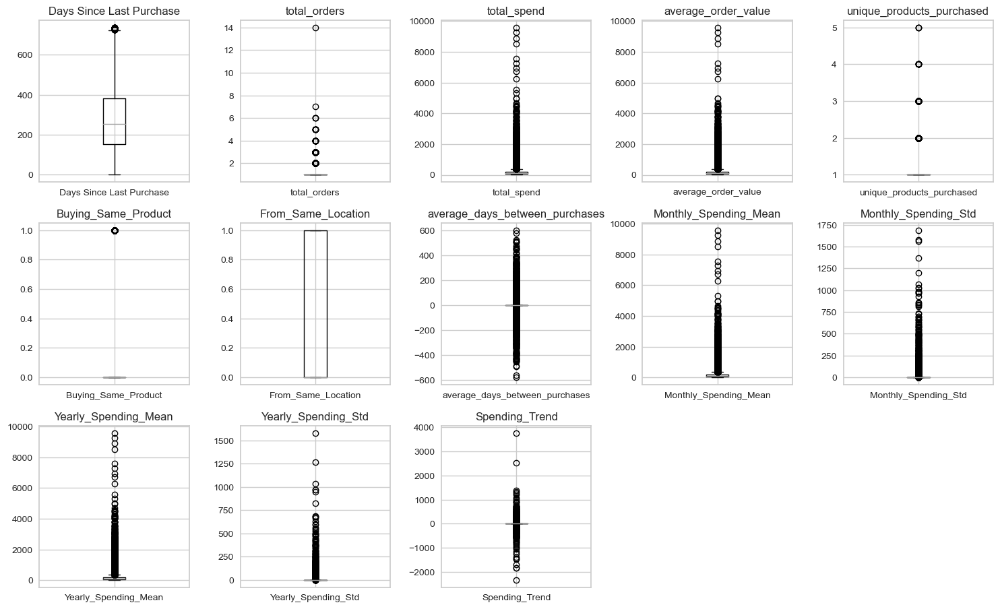

In [78]:
# Plotting box plots for each feature
plt.figure(figsize=(15, 15))
for i, column in enumerate(customer_engagement.columns[1:], 1):
    plt.subplot(5, 5, i)
    customer_engagement.boxplot(column=column)
    plt.title(column)

plt.tight_layout()
plt.show()

The Isolation Forest algorithm is a powerful tool for detecting and managing outliers, especially in scenarios like customer segmentation using K-means clustering.

Unsupervised Approach: In customer segmentation, where we often lack labeled data, this unsupervised approach is advantageous.

Fast and Scalable: Isolation Forests are built using binary trees. Each tree (called an Isolation Tree) processes a random subset of the data.

“Few and Different” Principle: The underlying idea is that anomalies are both “few” (fewer in number) and “different” (distinct from the majority). Isolation Forest leverages this principle, data points that require more splits to isolate them (travel deeper into the tree) are less likely to be anomalies. Conversely, points ending up in shorter branches are more likely to be anomalies.

No Assumptions About Data Distribution: It works well even when the data is irregularly distributed or contains complex patterns. In customer segmentation, where customer behavior can vary significantly, this flexibility is crucial.

Direct Anomaly Detection: The Isolation Forest algorithm directly quantifies how far a data point is from the rest of the data. It doesn’t rely on distance metrics or similarity scores.

In [79]:
# Initializing the IsolationForest model with a contamination parameter of 0.05
model = IsolationForest(contamination=0.05, random_state=0)

# Fitting the model on our dataset (converting DataFrame to NumPy to avoid warning)
customer_engagement['Outlier_Scores'] = model.fit_predict(customer_engagement.iloc[:, 1:].to_numpy())

# Creating a new column to identify outliers (1 for inliers and -1 for outliers)
customer_engagement['Is_Outlier'] = [1 if x == -1 else 0 for x in customer_engagement['Outlier_Scores']]

In [80]:
customer_engagement

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend,average_order_value,unique_products_purchased,Buying_Same_Product,From_Same_Location,average_days_between_purchases,Monthly_Spending_Mean,Monthly_Spending_Std,Yearly_Spending_Mean,Yearly_Spending_Std,Spending_Trend,Outlier_Scores,Is_Outlier
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1,141.90,141.90,1,0.0,1.0,0.0,141.90,0.0,141.90,0.0,0.0,1,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1,27.19,27.19,1,0.0,0.0,0.0,27.19,0.0,27.19,0.0,0.0,1,0
3,0000f6ccb0745a6a4b88665a16c9f078,350,1,43.62,43.62,1,0.0,0.0,0.0,43.62,0.0,43.62,0.0,0.0,1,0
4,0004aac84e0df4da2b147fca70cf8255,324,1,196.89,196.89,1,0.0,0.0,0.0,196.89,0.0,196.89,0.0,0.0,1,0
5,0004bd2a26a76fe21f786e4fbd80607f,193,1,166.98,166.98,1,0.0,0.0,0.0,166.98,0.0,166.98,0.0,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91459,fffb09418989a0dbff854a28163e47c6,295,1,73.16,73.16,1,0.0,1.0,0.0,73.16,0.0,73.16,0.0,0.0,1,0
91460,fffcf5a5ff07b0908bd4e2dbc735a684,468,1,4134.84,4134.84,1,0.0,1.0,0.0,4134.84,0.0,4134.84,0.0,0.0,-1,1
91462,ffff371b4d645b6ecea244b27531430a,602,1,112.46,112.46,1,0.0,0.0,0.0,112.46,0.0,112.46,0.0,0.0,1,0
91463,ffff5962728ec6157033ef9805bacc48,156,1,133.69,133.69,1,0.0,0.0,0.0,133.69,0.0,133.69,0.0,0.0,1,0


In [81]:
# Calculate the percentage of inliers and outliers
outlier_percentage = customer_engagement['Is_Outlier'].value_counts(normalize=True) * 100

In [82]:
outlier_percentage

0    94.999814
1     5.000186
Name: Is_Outlier, dtype: float64

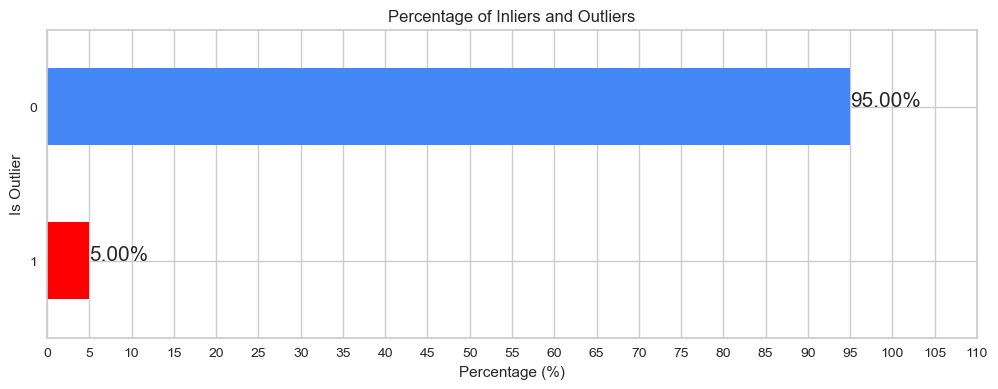

In [83]:
# Plotting the percentage of inliers and outliers
plt.figure(figsize=(12, 4))
outlier_percentage.plot(kind='barh', color=['#4287f5', '#ff0000'])

# Adding the percentage labels on the bars
for index, value in enumerate(outlier_percentage):
    plt.text(value, index, f'{value:.2f}%', fontsize=15)

plt.title('Percentage of Inliers and Outliers')
plt.xticks(ticks=np.arange(0, 115, 5))
plt.xlabel('Percentage (%)')
plt.ylabel('Is Outlier')
plt.gca().invert_yaxis()
plt.show()

In [84]:
# Separate the outliers for analysis
outliers_data = customer_engagement[customer_engagement['Is_Outlier'] == 1]

# Remove the outliers from the main dataset
customer_engagement_cleaned = customer_engagement[customer_engagement['Is_Outlier'] == 0]

# Drop the 'Outlier_Scores' and 'Is_Outlier' columns
customer_engagement_cleaned = customer_engagement_cleaned.drop(columns=['Outlier_Scores', 'Is_Outlier'])

# Reset the index of the cleaned data
customer_engagement_cleaned.reset_index(drop=True, inplace=True)

In [85]:
# Getting the number of rows in the cleaned customer dataset
customer_engagement_cleaned.shape[0]

76548

In [86]:
customer_engagement_cleaned

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend,average_order_value,unique_products_purchased,Buying_Same_Product,From_Same_Location,average_days_between_purchases,Monthly_Spending_Mean,Monthly_Spending_Std,Yearly_Spending_Mean,Yearly_Spending_Std,Spending_Trend
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1,141.90,141.90,1,0.0,1.0,0.0,141.90,0.0,141.90,0.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1,27.19,27.19,1,0.0,0.0,0.0,27.19,0.0,27.19,0.0,0.0
2,0000f6ccb0745a6a4b88665a16c9f078,350,1,43.62,43.62,1,0.0,0.0,0.0,43.62,0.0,43.62,0.0,0.0
3,0004aac84e0df4da2b147fca70cf8255,324,1,196.89,196.89,1,0.0,0.0,0.0,196.89,0.0,196.89,0.0,0.0
4,0004bd2a26a76fe21f786e4fbd80607f,193,1,166.98,166.98,1,0.0,0.0,0.0,166.98,0.0,166.98,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76543,fffa431dd3fcdefea4b1777d114144f2,341,1,81.20,81.20,1,0.0,1.0,0.0,81.20,0.0,81.20,0.0,0.0
76544,fffb09418989a0dbff854a28163e47c6,295,1,73.16,73.16,1,0.0,1.0,0.0,73.16,0.0,73.16,0.0,0.0
76545,ffff371b4d645b6ecea244b27531430a,602,1,112.46,112.46,1,0.0,0.0,0.0,112.46,0.0,112.46,0.0,0.0
76546,ffff5962728ec6157033ef9805bacc48,156,1,133.69,133.69,1,0.0,0.0,0.0,133.69,0.0,133.69,0.0,0.0


# Correlation Analysis

Correlation analysis helps identify which features are strongly related to each other. Multicollinearity occurs when two or more features are highly correlated. In K-means, multicollinearity can lead to biased cluster assignments. Reducing dimensionality simplifies the clustering process. Techniques like Principal Component Analysis (PCA) can be applied based on correlations.

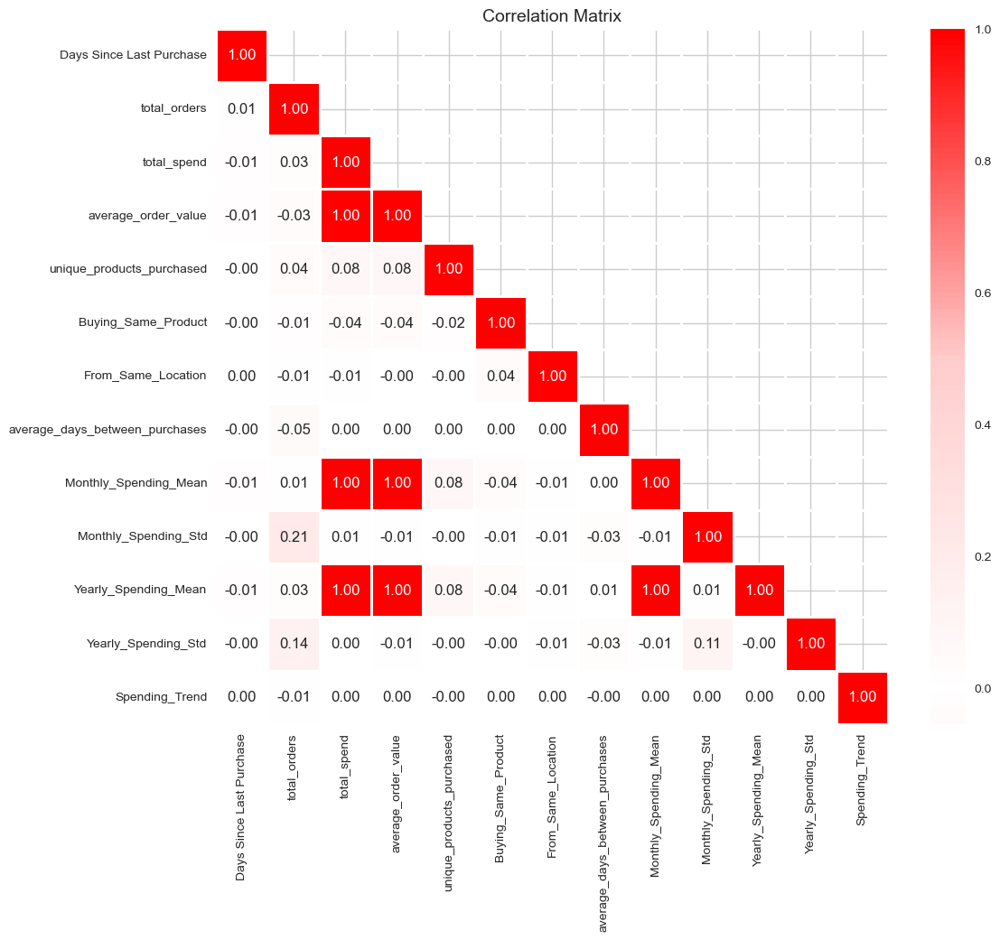

In [87]:
# Reset background style
sns.set_style('whitegrid')

# Calculate the correlation matrix excluding the 'customer_unique_id' column
corr = customer_engagement_cleaned.drop(columns=['customer_unique_id']).corr()

# Define a custom colormap
colors = ['#ff0000', '#ffcccc', 'white', '#ffcccc', '#ff0000']
my_cmap = LinearSegmentedColormap.from_list('custom_map', colors, N=256)

# Create a mask to only show the lower triangle of the matrix (since it's mirrored around its top-left to bottom-right diagonal)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, k=1)] = True

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr, mask=mask, cmap=my_cmap, annot=True, center=0, fmt='.2f', linewidths=2)
plt.title('Correlation Matrix', fontsize=14)
plt.show()

Color Coding:

Darker colors represent stronger correlations.

Lighter colors indicate weaker correlations.

Positive correlations (when one variable increases, the other tends to increase) are usually shown in warm colors.

Negative correlations (when one variable increases, the other tends to decrease) are usually shown in cool colors.

Pairs of variables that have high correlations:

average_order_value & total_spend

Monthly_Spending_Mean & total_spend

Monthly_Spending_Mean & average_order_value

Yearly_Spending_Mean & total_spend

Yearly_Spending_Mean & average_order_value

Yearly_Spending_Mean & Monthly_Spending_Mean

Now to achive uncorrelated variables, have to apply PCA technique.

# Feature Scaling

K-Means Clustering:

K-means relies on distance calculations between data points. Scaling ensures that all features contribute equally to the algorithm.

Proper scaling prevents biased clusters based on feature magnitudes.

Scaling accelerates convergence by ensuring similar ranges for all features. Faster convergence leads to quicker model training.

Scaling makes the algorithm more stable across different datasets.

PCA (Principal Component Analysis):

PCA aims to find orthogonal axes (principal components) that capture maximum variance. Scaling ensures that features contribute equally to the principal components.

Scaled features allow meaningful interpretation of principal components.

Scaling ensures that eigenvalues reflect true variance proportions.

Scaling maintains a stable covariance matrix for accurate eigen decomposition.

In [88]:
# Initialize the StandardScaler
scaler = StandardScaler()

# List of columns that don't need to be scaled
columns_to_exclude = ['customer_unique_id', 'total_orders', 'unique_products_purchased', 'Buying_Same_Product', 'From_Same_Location']

# List of columns that need to be scaled
columns_to_scale = customer_engagement_cleaned.columns.difference(columns_to_exclude)

# Copy the cleaned dataset
customer_engagement_scaled = customer_engagement_cleaned.copy()

# Applying the scaler to the necessary columns in the dataset
customer_engagement_scaled[columns_to_scale] = scaler.fit_transform(customer_engagement_scaled[columns_to_scale])

In [89]:
customer_engagement_scaled

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend,average_order_value,unique_products_purchased,Buying_Same_Product,From_Same_Location,average_days_between_purchases,Monthly_Spending_Mean,Monthly_Spending_Std,Yearly_Spending_Mean,Yearly_Spending_Std,Spending_Trend
0,0000366f3b9a7992bf8c76cfdf3221e2,-0.788565,1,0.015027,0.020546,1,0.0,1.0,0.004152,0.016633,-0.018104,0.015200,-0.008061,-0.00196
1,0000b849f77a49e4a4ce2b2a4ca5be3f,-0.748952,1,-0.936622,-0.932850,1,0.0,0.0,0.004152,-0.935584,-0.018104,-0.936465,-0.008061,-0.00196
2,0000f6ccb0745a6a4b88665a16c9f078,0.505465,1,-0.800316,-0.796294,1,0.0,0.0,0.004152,-0.799197,-0.018104,-0.800158,-0.008061,-0.00196
3,0004aac84e0df4da2b147fca70cf8255,0.333808,1,0.471232,0.477588,1,0.0,0.0,0.004152,0.473109,-0.018104,0.471411,-0.008061,-0.00196
4,0004bd2a26a76fe21f786e4fbd80607f,-0.531079,1,0.223094,0.228995,1,0.0,0.0,0.004152,0.224824,-0.018104,0.223270,-0.008061,-0.00196
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76543,fffa431dd3fcdefea4b1777d114144f2,0.446046,1,-0.488548,-0.483953,1,0.0,1.0,0.004152,-0.487243,-0.018104,-0.488384,-0.008061,-0.00196
76544,fffb09418989a0dbff854a28163e47c6,0.142345,1,-0.555249,-0.550777,1,0.0,1.0,0.004152,-0.553983,-0.018104,-0.555086,-0.008061,-0.00196
76545,ffff371b4d645b6ecea244b27531430a,2.169219,1,-0.229211,-0.224140,1,0.0,0.0,0.004152,-0.227751,-0.018104,-0.229043,-0.008061,-0.00196
76546,ffff5962728ec6157033ef9805bacc48,-0.775361,1,-0.053084,-0.047690,1,0.0,0.0,0.004152,-0.051519,-0.018104,-0.052913,-0.008061,-0.00196


# Dimensionality Reduction

To remove multicollinear features issues.

PCA compresses the original features into a smaller set of principal components. These components capture most of the data’s variance. By retaining only a few components, we reduce storage requirements and computational complexity.

PCA focuses on the most informative dimensions, filtering out noise. Cleaner data leads to better clustering results.

Clusters become more distinct, as irrelevant features are removed. The reduced feature space enhances the algorithm’s efficiency.

PCA transforms data into a lower-dimensional space (e.g., 2D or 3D), allowing visualization.

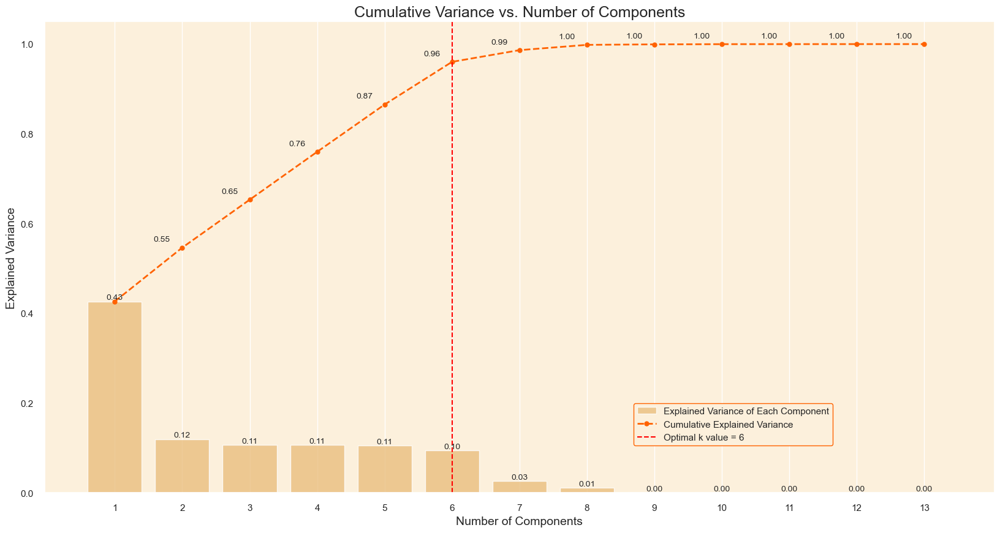

In [90]:
# Setting customer_unique_id as the index column
customer_engagement_scaled.set_index('customer_unique_id', inplace=True)

# Apply PCA
pca = PCA().fit(customer_engagement_scaled)

# Calculate the Cumulative Sum of the Explained Variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Set the optimal k value
optimal_k = 6

# Set seaborn plot style
sns.set(rc={'axes.facecolor': '#fcf0dc'}, style='darkgrid')

# Plot the cumulative explained variance against the number of components
plt.figure(figsize=(20, 10))

# Bar chart for the explained variance of each component
barplot = sns.barplot(x=list(range(1, len(cumulative_explained_variance) + 1)), y=explained_variance_ratio, color='#fcc36d', alpha=0.8)

# Line plot for the cumulative explained variance
lineplot, = plt.plot(range(0, len(cumulative_explained_variance)), cumulative_explained_variance, marker='o', linestyle='--', color='#ff6200', linewidth=2)

# Plot optimal k value line
optimal_k_line = plt.axvline(optimal_k - 1, color='red', linestyle='--', label=f'Optimal k value = {optimal_k}') 

# Set labels and title
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Explained Variance', fontsize=14)
plt.title('Cumulative Variance vs. Number of Components', fontsize=18)

# Customize ticks and legend
plt.xticks(range(0, len(cumulative_explained_variance)))
plt.legend(handles=[barplot.patches[0], lineplot, optimal_k_line], labels=['Explained Variance of Each Component', 'Cumulative Explained Variance', f'Optimal k value = {optimal_k}'], loc=(0.62, 0.1), frameon=True, framealpha=1.0,   edgecolor='#ff6200')  

# Display the variance values for both graphs on the plots
x_offset = -0.3
y_offset = 0.01
for i, (ev_ratio, cum_ev_ratio) in enumerate(zip(explained_variance_ratio, cumulative_explained_variance)):
    plt.text(i, ev_ratio, f"{ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)
    if i > 0:
        plt.text(i + x_offset, cum_ev_ratio + y_offset, f"{cum_ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)

plt.grid(axis='both')   
plt.show()

When selecting the optimal number of components, we typically seek a point where adding another component no longer significantly boosts the cumulative explained variance, often termed as the "elbow point" in the curve.

From the plotted data, it's evident that the increase in cumulative variance begins to down after the 6th component, accounting for 96% of the total variance.

Considering the objective of customer segmentation, our aim is to retain adequate information to effectively identify distinct customer groups. Hence, retaining the first 6 components appears to strike a balance. These components collectively explain a substantial portion of the total variance while simultaneously reducing the dataset's dimensionality.

In [91]:
# Creating a PCA object with 6 components
pca = PCA(n_components=6)

# Fitting and transforming the original data to the new PCA dataframe
customer_engagement_pca = pca.fit_transform(customer_engagement_scaled)

# Creating a new dataframe from the PCA dataframe, with columns labeled PC1, PC2, etc.
customer_engagement_pca = pd.DataFrame(customer_engagement_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

# Adding the UserID index back to the new PCA dataframe
customer_engagement_pca.index = customer_engagement_scaled.index

In [92]:
customer_engagement_pca

,PC1,PC2,PC3,PC4,PC5,PC6
customer_unique_id,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.041267,-0.004637,0.594480,-0.501182,-0.121194,-0.014763
0000b849f77a49e4a4ce2b2a4ca5be3f,-1.862062,-0.002231,0.579925,-0.490109,-0.111695,-0.021304
0000f6ccb0745a6a4b88665a16c9f078,-1.601187,-0.029667,-0.368371,0.311805,0.076442,0.016318
0004aac84e0df4da2b147fca70cf8255,0.944880,-0.022525,-0.255447,0.220828,0.048225,0.018508
0004bd2a26a76fe21f786e4fbd80607f,0.456534,-0.004014,0.400390,-0.334312,-0.081195,-0.008308
...,...,...,...,...,...,...
fffa431dd3fcdefea4b1777d114144f2,-0.978109,-0.033314,-0.330518,0.278798,0.065195,0.018637
fffb09418989a0dbff854a28163e47c6,-1.108705,-0.026760,-0.100490,0.084160,0.019710,0.009337
ffff371b4d645b6ecea244b27531430a,-0.474128,-0.065030,-1.631207,1.381071,0.325224,0.068435


In [93]:
# Define a function to highlight the top 3 absolute values in each column of a dataframe
def top_3(column):
    top3 = column.abs().nlargest(3).index
    return ['background-color:  #ffeacc' if i in top3 else '' for i in column.index]

# Create the PCA component DataFrame and apply the highlighting function
pc_df = pd.DataFrame(pca.components_.T, columns=['PC{}'.format(i+1) for i in range(pca.n_components_)],  
                     index=customer_engagement_scaled.columns)

pc_df.style.apply(top_3, axis=0)

,PC1,PC2,PC3,PC4,PC5,PC6
Days Since Last Purchase,-0.009471,-0.022156,-0.754547,0.637692,0.150188,0.029373
total_orders,0.000399,0.020077,-0.000201,0.001748,0.002571,-0.005270
total_spend,0.500066,0.008192,-0.003129,0.003918,0.001519,-0.001612
average_order_value,0.499600,-0.004996,-0.003351,0.002835,-0.002511,0.006167
unique_products_purchased,0.002725,-0.000090,0.000015,0.000065,0.000099,0.000062
Buying_Same_Product,-0.007023,-0.002455,-0.000443,-0.002100,-0.000095,0.001028
From_Same_Location,-0.001351,-0.005782,-0.002911,0.000351,-0.001726,0.002291
average_days_between_purchases,0.002857,-0.310073,0.082110,-0.133754,0.937557,-0.013552
Monthly_Spending_Mean,0.500082,-0.004897,-0.003293,0.003974,-0.002561,0.006126
Monthly_Spending_Std,0.001249,0.673447,-0.002284,0.003068,0.213204,-0.707397


# K-Means Clustering

Determining the Optimal Number of Clusters:

Elbow Method

Concept:

The Elbow method evaluates the sum of squared distances (inertia) for different values of K (number of clusters).

It looks for the “elbow” point in the plot where the rate of decrease in inertia slows down.

How It Works:

Run K-means clustering for a range of K values.

Calculate the inertia (sum of squared distances) for each K.

Plot the inertia against K.

The “elbow” point indicates the optimal K.

Pros:

Simple and intuitive.

Provides a visual clue for choosing K.

Cons:

Ambiguous if the plot lacks a clear elbow point.

Doesn’t work well for non-convex clusters.

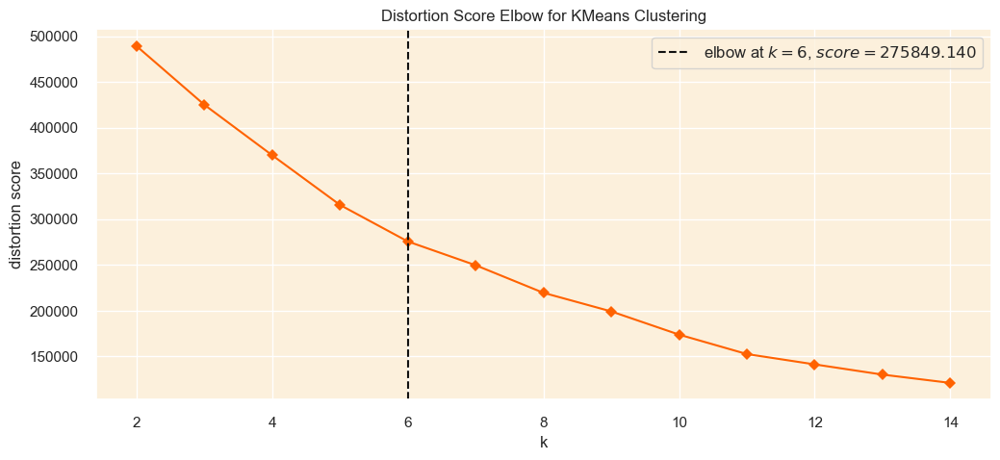

In [94]:
# Set plot style, and background color
sns.set(style='darkgrid', rc={'axes.facecolor': '#fcf0dc'})

# Set the color palette for the plot
sns.set_palette(['#ff6200'])

# Instantiate the clustering model with the specified parameters
km = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=0)

# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(12, 5))

# Instantiate the KElbowVisualizer with the model and range of k values, and disable the timing plot
visualizer = KElbowVisualizer(km, k=(2, 15), timings=False, ax=ax)

# Fit the data to the visualizer
visualizer.fit(customer_engagement_pca)

# Finalize and render the figure
visualizer.show();

Silhouette Method

Concept:

Silhouette analysis assesses the separation distance between resulting clusters.

Measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation).

How It Works:

Calculate the silhouette score for each data point.

Calculate a_i: Compute the average distance between point i and all other points within its cluster.

Calculate b_i: Compute the average distance between point i and all points in the nearest cluster to its own.

Now compute the silhouette score (s_i) = (b_i−a_i)/max(b_i,a_i)

Silhouette score ranges from -1 to 1:

Near +1: Sample is far from neighboring clusters.

0: Sample is on the decision boundary between clusters.

Negative: Sample might be assigned to the wrong cluster.

Choose the K value that maximizes the average silhouette score.

Pros:

Considers both cohesion and separation.

Works well for non-convex clusters.

Cons:

Computationally expensive for large datasets.

Choosing Between Them:

Silhouette Method is better than Elbow Method.

In [95]:
# Perform Silhouette analysis for a range of k values and visualize the results.
def silhouette_analysis(df, start_k, stop_k, figsize=(15, 16)):
    # Set the size of the figure
    plt.figure(figsize=figsize)

    # Create a grid with (stop_k - start_k + 1) rows and 2 columns
    grid = gridspec.GridSpec(stop_k - start_k + 1, 2)

    # Assign the first plot to the first row and both columns
    first_plot = plt.subplot(grid[0, :])

    # First plot: Silhouette scores for different k values
    sns.set_palette(['darkorange'])

    silhouette_scores = []

    # Iterate through the range of k values
    for k in range(start_k, stop_k + 1):
        km = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=0)
        km.fit(df)
        labels = km.predict(df)
        score = silhouette_score(df, labels)
        silhouette_scores.append(score)

    best_k = start_k + silhouette_scores.index(max(silhouette_scores))

    plt.plot(range(start_k, stop_k + 1), silhouette_scores, marker='o')
    plt.xticks(range(start_k, stop_k + 1))
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette score')
    plt.title('Average Silhouette Score for Different k Values', fontsize=15)

    # Add the optimal k value text to the plot
    optimal_k_text = f'The k value with the highest Silhouette score is: {best_k}'
    plt.text(10, 0.23, optimal_k_text, fontsize=12, verticalalignment='bottom', horizontalalignment='left', bbox=dict(facecolor='#fcc36d', edgecolor='#ff6200', boxstyle='round, pad=0.5'))

    # Second plot (subplot): Silhouette plots for each k value
    colors = sns.color_palette("bright")

    for i in range(start_k, stop_k + 1):    
        km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=0)
        row_idx, col_idx = divmod(i - start_k, 2)

        # Assign the plots to the second, third, and fourth rows
        ax = plt.subplot(grid[row_idx + 1, col_idx])

        visualizer = SilhouetteVisualizer(km, colors=colors, ax=ax)
        visualizer.fit(df)

        # Add the Silhouette score text to the plot
        score = silhouette_score(df, km.labels_)
        ax.text(0.97, 0.02, f'Silhouette Score: {score:.2f}', fontsize=12, ha='right', transform=ax.transAxes, color='red')

        ax.set_title(f'Silhouette Plot for {i} Clusters', fontsize=15)

    plt.tight_layout()
    plt.show()

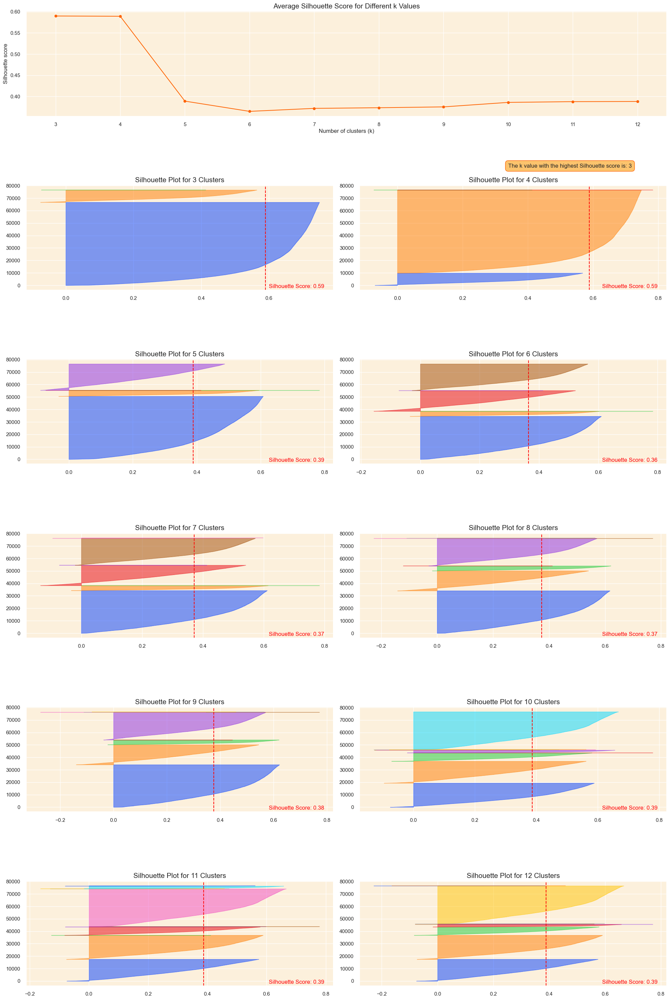

In [96]:
silhouette_analysis(customer_engagement_pca, 3, 12, figsize=(20, 50))

To interpret silhouette plots and determine the optimal number of clusters (k), the following criteria are considered:

Silhouette Plot Analysis:-

Silhouette Score Width:

Wide Widths (closer to +1): Indicate well-separated clusters, with data points distinct from other clusters.

Narrow Widths (closer to -1): Suggest poorly defined clusters, where data points are not distinctly separated.

Average Silhouette Score:

High Average Width: Reflects well-separated clusters.

Low Average Width: Indicates poor separation between clusters.

Uniformity in Cluster Size:

Cluster Thickness:

Uniform Thickness: Suggests balanced clusters with a roughly equal number of data points.

Variable Thickness: Signifies an uneven distribution of data points across clusters.

Peaks in Average Silhouette Score:

Clear Peaks: Indicate potential optimal k values.

Minimize Fluctuations in Silhouette Plot Widths:

Uniform Widths: Prefer silhouette plots with consistent widths across clusters.

Variable Widths: Avoid fluctuations, suggesting poorly defined clusters.

Optimal Cluster Selection:

Maximize Overall Average Silhouette Score: Choose the k value with the highest average silhouette score across clusters.

Avoid Below-Average Scores: Ensure most clusters have above-average silhouette scores to maintain optimal clustering.

Visual Inspection of Silhouette Plots:

Consistent Cluster Formation: Visually examine silhouette plots for consistent and structured clusters.

Cluster Compactness: Look for compact clusters, with data points having silhouette scores closer to +1, indicating better clustering.

# Apply Clustering Model K-means:

K-Means Clustering:

K-means is an unsupervised learning algorithm used for clustering.

The “K” in K-means represents the number of predefined clusters we want to create.

The algorithm partitions data points into K clusters based on similarity.

Each cluster is associated with a centroid (a representative point).

The main idea is to minimize the distance between data points and their respective cluster centroids.

How K-Means Works:-

Initialization:

Choose the number of clusters (K).

Randomly initialize K centroids.

Assignment:

Assign each data point to the nearest centroid (cluster).

Calculate distances (usually Euclidean distance) between data points and centroids.

Update Centroids:

Recalculate the mean (centroid) for each cluster.

Move the centroids to the new mean positions.

Repeat Steps 2 and 3:

Iterate until the centroids no longer change significantly.

Final Clusters:

The resulting clusters represent distinct customer segments.

In [105]:
# Apply KMeans clustering using the optimal k
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=10, max_iter=100, random_state=0)
kmeans.fit(customer_engagement_pca)

# Get the frequency of each cluster
cluster_frequencies = Counter(kmeans.labels_)

# Create a mapping from old labels to new labels based on frequency
label_mapping = {label: new_label for new_label, (label, _) in enumerate(cluster_frequencies.most_common())}

# Reverse the mapping to assign labels as per your criteria
label_mapping = {v: k for k, v in {2: 0, 1: 1, 0: 2}.items()}

# Apply the mapping to get the new labels
new_labels = np.array([label_mapping[label] for label in kmeans.labels_])

# Append the new cluster labels back to the original dataset
customer_engagement_cleaned['cluster'] = new_labels

# Append the new cluster labels to the PCA version of the dataset
customer_engagement_pca['cluster'] = new_labels

In [106]:
customer_engagement_cleaned

,customer_unique_id,Days Since Last Purchase,total_orders,total_spend,average_order_value,unique_products_purchased,Buying_Same_Product,From_Same_Location,average_days_between_purchases,Monthly_Spending_Mean,Monthly_Spending_Std,Yearly_Spending_Mean,Yearly_Spending_Std,Spending_Trend,cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,154,1,141.90,141.90,1,0.0,1.0,0.0,141.90,0.0,141.90,0.0,0.0,2
1,0000b849f77a49e4a4ce2b2a4ca5be3f,160,1,27.19,27.19,1,0.0,0.0,0.0,27.19,0.0,27.19,0.0,0.0,2
2,0000f6ccb0745a6a4b88665a16c9f078,350,1,43.62,43.62,1,0.0,0.0,0.0,43.62,0.0,43.62,0.0,0.0,2
3,0004aac84e0df4da2b147fca70cf8255,324,1,196.89,196.89,1,0.0,0.0,0.0,196.89,0.0,196.89,0.0,0.0,2
4,0004bd2a26a76fe21f786e4fbd80607f,193,1,166.98,166.98,1,0.0,0.0,0.0,166.98,0.0,166.98,0.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76543,fffa431dd3fcdefea4b1777d114144f2,341,1,81.20,81.20,1,0.0,1.0,0.0,81.20,0.0,81.20,0.0,0.0,2
76544,fffb09418989a0dbff854a28163e47c6,295,1,73.16,73.16,1,0.0,1.0,0.0,73.16,0.0,73.16,0.0,0.0,2
76545,ffff371b4d645b6ecea244b27531430a,602,1,112.46,112.46,1,0.0,0.0,0.0,112.46,0.0,112.46,0.0,0.0,2
76546,ffff5962728ec6157033ef9805bacc48,156,1,133.69,133.69,1,0.0,0.0,0.0,133.69,0.0,133.69,0.0,0.0,2


In [107]:
customer_engagement_pca

,PC1,PC2,PC3,PC4,PC5,PC6,cluster
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.041267,-0.004637,0.594480,-0.501182,-0.121194,-0.014763,2
0000b849f77a49e4a4ce2b2a4ca5be3f,-1.862062,-0.002231,0.579925,-0.490109,-0.111695,-0.021304,2
0000f6ccb0745a6a4b88665a16c9f078,-1.601187,-0.029667,-0.368371,0.311805,0.076442,0.016318,2
0004aac84e0df4da2b147fca70cf8255,0.944880,-0.022525,-0.255447,0.220828,0.048225,0.018508,2
0004bd2a26a76fe21f786e4fbd80607f,0.456534,-0.004014,0.400390,-0.334312,-0.081195,-0.008308,2
...,...,...,...,...,...,...,...
fffa431dd3fcdefea4b1777d114144f2,-0.978109,-0.033314,-0.330518,0.278798,0.065195,0.018637,2
fffb09418989a0dbff854a28163e47c6,-1.108705,-0.026760,-0.100490,0.084160,0.019710,0.009337,2
ffff371b4d645b6ecea244b27531430a,-0.474128,-0.065030,-1.631207,1.381071,0.325224,0.068435,2


# Clustering Evaluation

3D Visualization of Top Principal Components

In [108]:
# Setting up the color scheme for the clusters (RGB order)
colors = ['#1ac938', '#023eff', '#ff7c00']

# Create separate data frames for each cluster
cluster_0 = customer_engagement_pca[customer_engagement_pca['cluster'] == 0]
cluster_1 = customer_engagement_pca[customer_engagement_pca['cluster'] == 1]
cluster_2 = customer_engagement_pca[customer_engagement_pca['cluster'] == 2]

# Create a 3D scatter plot
fig = go.Figure()

# Add data points for each cluster separately and specify the color
fig.add_trace(go.Scatter3d(x=cluster_0['PC1'], y=cluster_0['PC2'], z=cluster_0['PC3'], mode='markers', marker=dict(color=colors[0], size=5, opacity=0.4), name='Cluster 0'))
fig.add_trace(go.Scatter3d(x=cluster_1['PC1'], y=cluster_1['PC2'], z=cluster_1['PC3'], mode='markers', marker=dict(color=colors[1], size=5, opacity=0.4), name='Cluster 1'))
fig.add_trace(go.Scatter3d(x=cluster_2['PC1'], y=cluster_2['PC2'], z=cluster_2['PC3'], mode='markers', marker=dict(color=colors[2], size=5, opacity=0.4), name='Cluster 2'))

# Set the title and layout details
fig.update_layout(
    title=dict(text='3D Visualization of Customer Clusters in PCA Space with 3 Clusters', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC1'),
        yaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC2'),
        zaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC3'),
    ),
    width=900,
    height=800
)

# Show the plot
fig.show()

Cluster Distribution Visualization

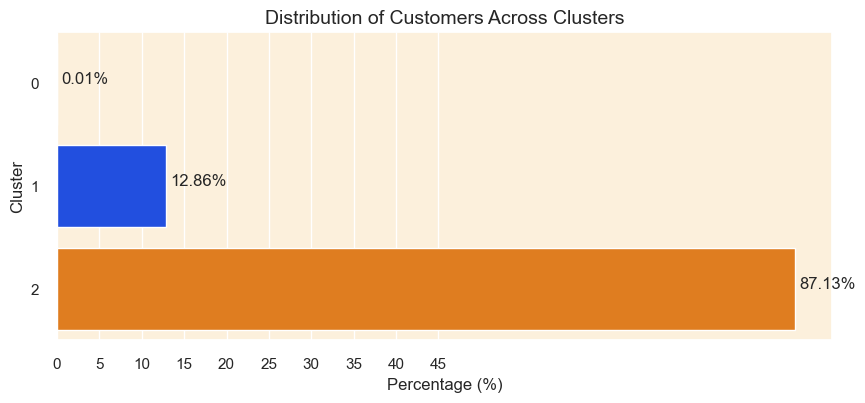

In [109]:
# Calculate the percentage of customers in each cluster
cluster_percentage = (customer_engagement_pca['cluster'].value_counts(normalize=True) * 100).reset_index()
cluster_percentage.columns = ['Cluster', 'Percentage']
cluster_percentage.sort_values(by='Cluster', inplace=True)

# Create a horizontal bar plot
plt.figure(figsize=(10, 4))
sns.barplot(x='Percentage', y='Cluster', data=cluster_percentage, orient='h', palette=colors)

# Adding percentages on the bars
for index, value in enumerate(cluster_percentage['Percentage']):
    plt.text(value+0.5, index, f'{value:.2f}%')

plt.title('Distribution of Customers Across Clusters', fontsize=14)
plt.xticks(ticks=np.arange(0, 50, 5))
plt.xlabel('Percentage (%)')

# Show the plot
plt.show()

Cluster 2 is the best cluster having highest percentage of customers.

Evaluation Metrics

Silhouette Score:

The Silhouette Score assesses the quality of clustering by comparing the similarity of data points within the same cluster to data points in different clusters.

Mathematical Formula:

For each data point i:

Calculate the average distance from i to other data points in the same cluster (a_i)

Calculate the average distance from i to data points in a different cluster (b_i)

Silhouette Score for data point i: (s_i) = (b_i−a_i)/max(b_i,a_i)

The overall Silhouette Score is the mean of all individual data point scores.

Interpretation:

Ranges from -1 (poor clustering) to +1 (perfect clustering).

A score close to 1 suggests well-separated clusters.

Davies-Bouldin Index:

The Davies-Bouldin Index evaluates the average similarity between each cluster and its most comparable cluster.

Mathematical Formula:

For each cluster i:

Calculate the dissimilarity between cluster i and the cluster most similar to i.

Davies-Bouldin Index (DB) is the average of these dissimilarities: DB = (1/n)∑max(j!=i)((a_i+a_j)/d(i,j))

n is the number of clusters.

a_i is a measure of dissimilarity between cluster i and its centroid.

d(i,j) is the distance between centroids of clusters i and j.

Interpretation:

Lower numbers suggest better clustering solutions.

Calinski-Harabasz Index (Variance Ratio Criterion):

The Calinski-Harabasz Index measures the ratio of between-cluster variance to within-cluster variance.

Mathematical Formula:

Calculate the sum of squares between clusters (B) and within clusters (W):

B = ∑n_i||C_i-C||^2

W = ∑∑||x-C_i||^2

Calinski-Harabasz Index (CH): CH = (B/W).(N-K)/(K-1)

K is the number of clusters.

N is the total number of data points.

Interpretation:

Higher numbers suggest better-defined clusters.

In [110]:
# Compute number of customers
num_observations = len(customer_engagement_pca)

# Separate the features and the cluster labels
X = customer_engagement_pca.drop('cluster', axis=1)
clusters = customer_engagement_pca['cluster']

# Compute the metrics
sil_score = silhouette_score(X, clusters)
calinski_score = calinski_harabasz_score(X, clusters)
davies_score = davies_bouldin_score(X, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))

+-------------------------+--------------------+
|         Metric          |       Value        |
+-------------------------+--------------------+
| Number of Observations  |       76548        |
|    Silhouette Score     | 0.588057926925987  |
| Calinski Harabasz Score | 22410.776333203114 |
|  Davies Bouldin Score   | 0.5673859307186235 |
+-------------------------+--------------------+


Silhouette Score: This is a measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation). The silhouette score ranges from -1 to 1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters. A score of 0 indicates overlapping clusters. In this case, the silhouette score is approximately 0.5881, indicating a reasonable clustering structure.

Calinski Harabasz Score: This score, also known as the Variance Ratio Criterion, is a measure of the ratio between the within-cluster dispersion and the between-cluster dispersion. Higher values indicate better-defined clusters. In this case, the score is approximately 22,410.7763.

Davies Bouldin Score: This score is defined as the average similarity between each cluster and its most similar cluster, where similarity is measured by the ratio of within-cluster distances to between-cluster distances. Lower values indicate better clustering, with 0 indicating the best possible score. In this case, the Davies Bouldin Score is approximately 0.5674, suggesting good separation between clusters.

Overall, based on the silhouette score, the Calinski Harabasz score, and the Davies Bouldin score, it appears that the clustering algorithm has produced reasonably well-defined clusters in the dataset.

# Cluster Analysis and Profiling

Radar Chart Approach

To create radar charts for visualizing the centroid values of each cluster across different features, we must initially calculate the centroid for each cluster. This centroid serves as the mean value for all features within a particular cluster. Afterward, we'll display these centroids on radar charts, enabling a straightforward visualization of the central tendencies of each feature across the clusters.

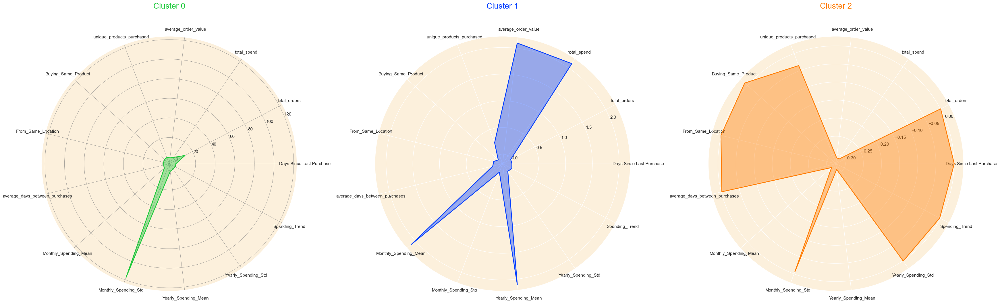

In [111]:
# Setting 'customer_unique_id' column as index and assigning it to a new dataframe
df_customer = customer_engagement_cleaned.set_index('customer_unique_id')

# Standardize the data (excluding the cluster column)
scaler = StandardScaler()
df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['cluster'], axis=1))

# Create a new dataframe with standardized values and add the cluster column back
df_customer_standardized = pd.DataFrame(df_customer_standardized, columns=df_customer.columns[:-1], index=df_customer.index)
df_customer_standardized['cluster'] = df_customer['cluster']

# Calculate the centroids of each cluster
cluster_centroids = df_customer_standardized.groupby('cluster').mean()

# Function to create a radar chart
def radar_chart(ax, angles, data, color, cluster):
    # Plot the data and fill the area
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')
    
    # Add a title
    ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

# Set data
labels=np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]

# Initialize the figure
fig, ax = plt.subplots(figsize=(35, 25), subplot_kw=dict(polar=True), nrows=1, ncols=3)

# Create radar chart for each cluster
for i, color in enumerate(colors):
    data = cluster_centroids.loc[i].tolist()
    data += data[:1]  # Complete the loop
    radar_chart(ax[i], angles, data, color, i)

# Add input data
ax[0].set_xticks(angles[:-1])
ax[0].set_xticklabels(labels[:-1])

ax[1].set_xticks(angles[:-1])
ax[1].set_xticklabels(labels[:-1])

ax[2].set_xticks(angles[:-1])
ax[2].set_xticklabels(labels[:-1])

# Add a grid
ax[0].grid(color='grey', linewidth=0.5)

# Display the plot
plt.tight_layout()
plt.show()

Histogram Chart Approach

We can validate the profiles identified from the radar charts by plotting histograms for each feature segmented by the cluster labels. These histograms provide a visual inspection of the distribution of feature values within each cluster, aiding in confirming or refining the profiles derived from the radar charts.

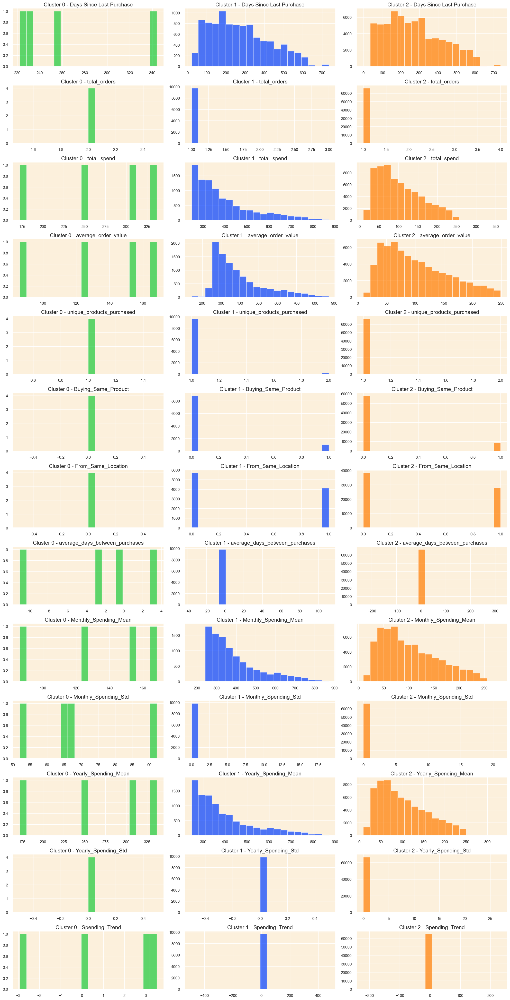

In [112]:
# Plot histograms for each feature segmented by the clusters
features = customer_engagement_cleaned.columns[1:-1]
clusters = customer_engagement_cleaned['cluster'].unique()
clusters.sort()

# Setting up the subplots
n_rows = len(features)
n_cols = len(clusters)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 3*n_rows))

# Plotting histograms
for i, feature in enumerate(features):
    for j, cluster in enumerate(clusters):
        data = customer_engagement_cleaned[customer_engagement_cleaned['cluster'] == cluster][feature]
        axes[i, j].hist(data, bins=20, color=colors[j], edgecolor='w', alpha=0.7)
        axes[i, j].set_title(f'Cluster {cluster} - {feature}', fontsize=15)
        axes[i, j].set_xlabel('')
        axes[i, j].set_ylabel('')

# Adjusting layout to prevent overlapping
plt.tight_layout()
plt.show()

cluster 1:

more frequently purchasing customers

more total spending customers

more average order/value customers

purchase more unique Products purhased customers

has best monthly spending mean and yearly spending mean

best spending trend

cluster 2:

many customers buy same product

many customers are from same location

has best average days between purchases customers

has the most monthly spending variability and yearly spending variability

cluster 0:

has highest no. of total orders